#### Importing required libraries

In [1]:
import os
import PIL
import json
import random
import shutil
import pickle
from tqdm import tqdm
from PIL import Image
from scipy import stats
from pathlib import Path
from tabulate import tabulate

import cv2
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

from xgboost import XGBClassifier

from skimage.io import imread, imshow
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GroupShuffleSplit
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

#### Data

In [4]:
DATA_DIR = "/content/drive/MyDrive/DH_307/OPMD_DATASET"

In [5]:
IMAGE_DIR                 = os.path.join(DATA_DIR, "Images")
ANNOTATION_FILE           = os.path.join(DATA_DIR, "Annotation.json")
IMAGEWISE_METADATA_FILE   = os.path.join(DATA_DIR, "Imagewise_Data.xlsx")
PATIENTWISE_METADATA_FILE = os.path.join(DATA_DIR, "Patientwise_Data.xlsx")

#### EDA on "Imagewise_Data.xlsx"

In [ ]:
df1 = pd.read_excel(IMAGEWISE_METADATA_FILE)

In [ ]:
print(f"No.of rows: {df1.shape[0]}")
print(f"No.of columns: {df1.shape[1]}")

No.of rows: 3000
No.of columns: 4


In [ ]:
df1.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
2,R-01-03,Benign,Coated Tongue,1
3,R-02-01,Benign,VBD,1
4,R-02-02,Benign,VBD,1


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Image Name               3000 non-null   object
 1   Category                 3000 non-null   object
 2   Clinical Diagnosis       3000 non-null   object
 3   Lesion Annotation Count  3000 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 93.9+ KB


In [ ]:
print("Number of unique values in each column:\n")
print(df1.nunique())

Number of unique values in each column:

Image Name                 3000
Category                      4
Clinical Diagnosis          155
Lesion Annotation Count       9
dtype: int64


In [ ]:
df1['Category'] = df1['Category'].astype('category')

In [ ]:
df1['Lesion Annotation Count'] = df1['Lesion Annotation Count'].astype("int8")

In [ ]:
print(df1.dtypes)

Image Name                   object
Category                   category
Clinical Diagnosis           object
Lesion Annotation Count        int8
dtype: object


In [ ]:
def analyze_column(df, column_to_analyze):

  # Get value counts and percentages
  value_counts = df[column_to_analyze].value_counts()
  percentages  = (value_counts / len(df))*100

  print(f"Unique values in '{column_to_analyze}':")

  # print counts and percentages
  for value, count in value_counts.items():
    percentage = percentages[value]
    print(f"{value}: {count} ({percentage:.2f}%)")

  print(f'\nTotal unique values: {len(value_counts)}')
  print(f"Total records: {len(df)}")

  # Calculate and print imbalance ratio
  if len(value_counts) >= 2:
    majority_count  = value_counts.iloc[0]
    minority_count  = value_counts.iloc[-1]
    imbalance_ratio = majority_count / minority_count
    print(f"Imbalance ratio: {imbalance_ratio:.0f}:1 (majority:minority)\n")
  else:
    print("Imbalance ratio: Cannot calculate (ony one class present)")

  # create bar plot
  plt.figure(figsize=(6,3))
  bars = value_counts.plot(kind='bar', color='lightgreen', edgecolor='black')

  plt.title(f'Distribution of {column_to_analyze}', fontsize=14)
  plt.xlabel(column_to_analyze)
  plt.ylabel('Count')
  plt.xticks(rotation=0, ha='center')

  # Add value labels on bars (count and percentage)
  for i, (v,p) in enumerate(zip(value_counts, percentages)):
    label = f"{v}\n({p:.1f}%)"
    plt.text(i, v + 0.05 * max(value_counts), label,
             ha = 'center', va='bottom', fontweight='bold', fontsize=9)

  plt.tight_layout()
  plt.show()

Unique values in 'Category':
OPMD: 1394 (46.47%)
Benign: 748 (24.93%)
Healthy: 729 (24.30%)
OCA: 129 (4.30%)

Total unique values: 4
Total records: 3000
Imbalance ratio: 11:1 (majority:minority)



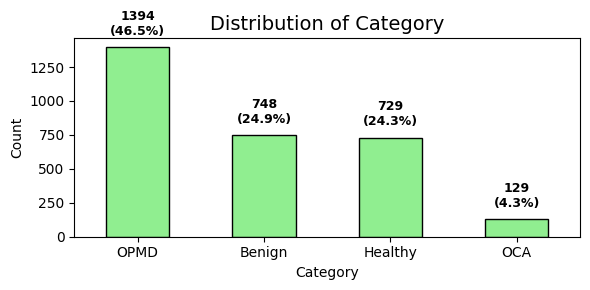

In [ ]:
analyze_column(df1, 'Category')

Unique values in 'Lesion Annotation Count':
1: 1621 (54.03%)
0: 729 (24.30%)
2: 383 (12.77%)
3: 168 (5.60%)
4: 59 (1.97%)
5: 19 (0.63%)
6: 15 (0.50%)
8: 3 (0.10%)
7: 3 (0.10%)

Total unique values: 9
Total records: 3000
Imbalance ratio: 540:1 (majority:minority)



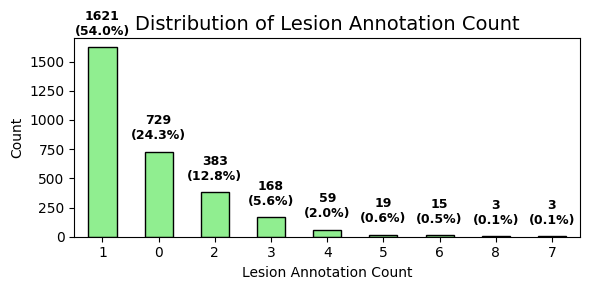

In [ ]:
analyze_column(df1, 'Lesion Annotation Count')

In [ ]:
def analyze_column_with_high_cardinality(df, column_to_analyze, top_n=None):

    print(f"Comprehensive Analysis for the column '{column_to_analyze}'")

    # Get value counts
    value_counts = df[column_to_analyze].value_counts()
    total_unique = len(value_counts)

    print(f"Total no.of unique values: {total_unique}")
    print(f"\nTop {top_n} most frequent values:")
    print(value_counts.head(top_n))

    print(f"\nBottom {min(5, total_unique)} least frequent values:")
    print(value_counts.tail(min(5, total_unique)))

    # Summary statistics
    print(f"\nSummary Statistics:")
    print(f"Most common value: '{value_counts.index[0]}' (count: {value_counts.iloc[0]})")
    print(f"Proportion of most common value: {value_counts.iloc[0]/len(df)*100:.2f}%")
    print(f"Number of values that appear only once: {(value_counts == 1).sum()}")
    print(f"Proportion of dataset covered by top 20 values: {value_counts.head(20).sum()/len(df)*100:.2f}%\n")

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

    # Plot 1: Top N values
    top_values = value_counts.head(top_n)
    bars1      = ax1.bar(range(len(top_values)), top_values.values, color='skyblue', edgecolor='black')
    ax1.set_title(f'Top {top_n} {column_to_analyze}', fontweight='bold')
    ax1.set_xlabel(column_to_analyze)
    ax1.set_ylabel('Count')
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_xticks(range(len(top_values)))
    ax1.set_xticklabels(top_values.index, ha='right')

    # Add value labels on top of bars
    for i, v in enumerate(top_values.values):
        ax1.text(i, v + 0.01 * max(top_values.values), str(v),
                ha='center', va='bottom', fontweight='bold', fontsize=8)

    # Plot 2: Cumulative distribution
    cumulative_pct = value_counts.cumsum() / len(df) * 100
    ax2.plot(range(1, len(cumulative_pct) + 1), cumulative_pct, 'b-', linewidth=2)
    ax2.set_title('Cumulative Distribution', fontweight='bold')
    ax2.set_xlabel('Number of Unique Values')
    ax2.set_ylabel('Cumulative Percentage (%)')
    ax2.grid(True, alpha=0.3)

    # Mark some key points
    for n in [5, 10, 20, 50]:
        if n <= len(cumulative_pct):
            ax2.axvline(x=n, color='red', linestyle='--', alpha=0.7)
            ax2.text(n, cumulative_pct.iloc[n-1] + 2, f'{cumulative_pct.iloc[n-1]:.1f}%',
                    ha='center', fontweight='bold')

    return value_counts

Comprehensive Analysis for the column 'Clinical Diagnosis'
Total no.of unique values: 155

Top 20 most frequent values:
Clinical Diagnosis
Normal Mucosa          728
OSF                    684
OLP                    358
Oral Cancer            125
VBD                    123
Candidiasis             81
OLP/LR                  78
Leukoplakia             70
Erythema Multiforme     45
OLP/ LR                 40
OFG                     34
RAU                     33
Coated Tongue           30
Mucocele                28
Allergy                 20
Leukplakia              19
Angular Cheilitis       15
MRG                     15
Erythroplakia           14
Trumatic Lesion         14
Name: count, dtype: int64

Bottom 5 least frequent values:
Clinical Diagnosis
OSF+Cyst              1
Allergic Reaction     1
Petichiae             1
Mucosil               1
Alevolar Keratosis    1
Name: count, dtype: int64

Summary Statistics:
Most common value: 'Normal Mucosa' (count: 728)
Proportion of most common va

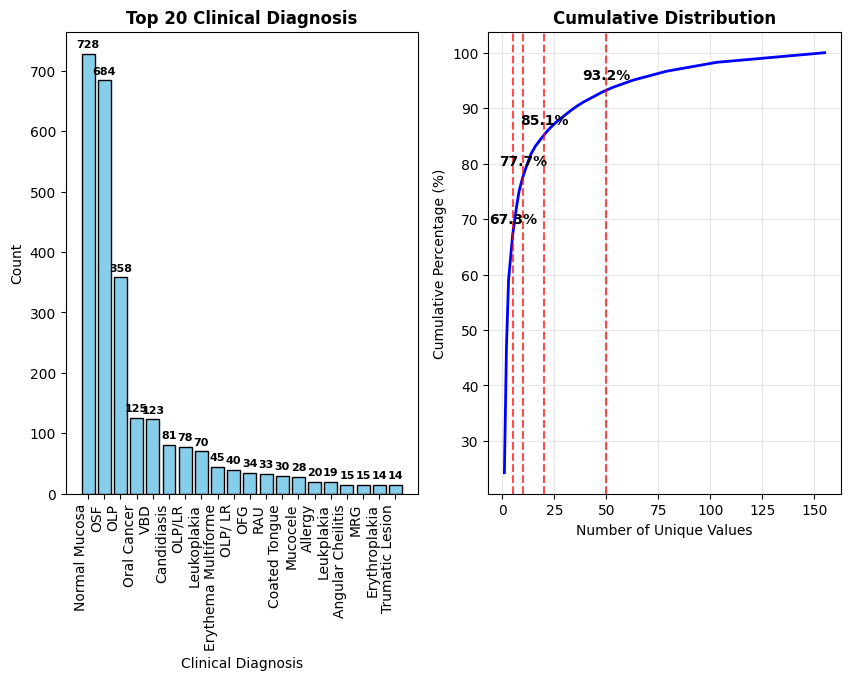

In [ ]:
clinical_diagnosis_counts = analyze_column_with_high_cardinality(df1, 'Clinical Diagnosis', top_n=20)

##### Comparitive Analysis Of Three Columns

In [ ]:
def diagnoses_by_category(df, category_name):
    """
    Get all diagnosis types for a specific category
    """
    # Filter data for the specific category
    category_data = df[df['Category'] == category_name]

    # Get diagnosis counts
    diagnosis_counts = category_data['Clinical Diagnosis'].value_counts()

    print(f"Diagnosis types for the category '{category_name}'")
    print(f"Total images in category: {len(category_data)}")
    print(f"Unique diagnoses: {len(diagnosis_counts)}")

In [ ]:
def diagnoses_count_by_category(df, category_name):
    """
    Get all diagnosis types and their counts for a specific category
    """
    # Filter data for the specific category
    category_data = df[df['Category'] == category_name]

    # Get diagnosis counts
    diagnosis_counts = category_data['Clinical Diagnosis'].value_counts()

    for diagnosis, count in diagnosis_counts.items():
        print(f"{diagnosis:<50} {count:>3} images")

In [ ]:
diagnoses_by_category(df1, 'OPMD')

Diagnosis types for the category 'OPMD'
Total images in category: 1394
Unique diagnoses: 43


In [ ]:
diagnoses_count_by_category(df1, 'OPMD')

OSF                                                684 images
OLP                                                356 images
OLP/LR                                              78 images
Leukoplakia                                         69 images
OLP/ LR                                             40 images
Leukplakia                                          19 images
PVL                                                 14 images
Erythroplakia                                       14 images
Leukoplakia + OSF                                   12 images
OLP /LR                                             11 images
Early OSF                                            9 images
OLP/DLE                                              9 images
OLP/ PVL                                             9 images
Leukplakia + OSF                                     7 images
Homogenous Leukoplakia                               6 images
Leukoplakia/ Candidiasis                             6 images
Erythrol

* OSF: Oral Submucous Fibrosis. It is a chronic, progressive disease characterized by the inflammation and fibrosis (scarring) of the submucosal tissues. This leads to stiffness of the oral mucosa, causing a burning sensation and eventually a severe inability to open the mouth (trismus).
It is a well-established OPMD with a significant risk of transforming into oral cancer (oral squamous cell carcinoma).

In [ ]:
diagnoses_by_category(df1, 'Benign')

Diagnosis types for the category 'Benign'
Total images in category: 748
Unique diagnoses: 110


In [ ]:
diagnoses_count_by_category(df1, 'Benign')

VBD                                                123 images
Candidiasis                                         81 images
Erythema Multiforme                                 45 images
OFG                                                 34 images
RAU                                                 33 images
Coated Tongue                                       29 images
Mucocele                                            28 images
Allergy                                             20 images
Angular Cheilitis                                   15 images
MRG                                                 15 images
Trumatic Lesion                                     14 images
Trumatic Ulcer                                      13 images
Herpes Zoster                                       11 images
Leukodema                                           10 images
Frictional Lesion                                    9 images
Pemphigoid                                           9 images
Geograph

* VBD (Vascular Benign Diagnosis) is a non-cancerous (benign) lesion that originates from blood vessels

In [ ]:
diagnoses_by_category(df1, 'Healthy')

Diagnosis types for the category 'Healthy'
Total images in category: 729
Unique diagnoses: 2


In [ ]:
diagnoses_count_by_category(df1, 'Healthy')

Normal Mucosa                                      727 images
OLP                                                  2 images


* OLP(Oral Lichen Planus) is a chronic inflammatory condition that affects the mucous membranes inside the mouth. It is not an infection and is not contagious




In [ ]:
diagnoses_by_category(df1, 'OCA')

Diagnosis types for the category 'OCA'
Total images in category: 129
Unique diagnoses: 4


In [ ]:
diagnoses_count_by_category(df1, 'OCA')

Oral Cancer                                        125 images
Verrucus Carcinoma                                   2 images
Oral Cancer + Leukoplakia                            1 images
Verucouss Ca                                         1 images


In [ ]:
# Category vs Lesion Annotation Count
print(" Category vs Lesion Annotation Count")
print("-" * 50)
category_lesion_stats = df1.groupby('Category',observed=True)['Lesion Annotation Count'].agg([
                        ('count', 'count'),
                        ('min', 'min'),
                        ('max', 'max'),
                        ('total_lesions', 'sum')]).round(2).sort_values('count',ascending=False)

print("Lesion Statistics by Category:")
print(category_lesion_stats)

 Category vs Lesion Annotation Count
--------------------------------------------------
Lesion Statistics by Category:
          count  min  max  total_lesions
Category                                
OPMD       1394    1    8           2037
Benign      748    1    8           1189
Healthy     729    0    0              0
OCA         129    1    2            131


In [ ]:
# Clinical Diagnosis vs Lesion Annotation Count (for top diagnoses)
print("\nTop Clinical Diagnoses vs Lesion Annotation count")
print("-" * 50)
top_10_diagnoses = df1['Clinical Diagnosis'].value_counts().head(10).index
top_diagnoses_df = df1[df1['Clinical Diagnosis'].isin(top_10_diagnoses)]

diagnosis_lesion_stats = top_diagnoses_df.groupby('Clinical Diagnosis')['Lesion Annotation Count'].agg([
                        ('image_count', 'count'),
                        ('min_lesions', 'min'),
                        ('max_lesions', 'max'),
                        ('total_lesions', 'sum')
                    ]).round(2).sort_values('image_count', ascending=False)

print("Lesion Statistics for Top 10 Clinical Diagnoses:")
print(diagnosis_lesion_stats)


Top Clinical Diagnoses vs Lesion Annotation count
--------------------------------------------------
Lesion Statistics for Top 10 Clinical Diagnoses:
                     image_count  min_lesions  max_lesions  total_lesions
Clinical Diagnosis                                                       
Normal Mucosa                728            0            1              1
OSF                          684            1            7            795
OLP                          358            0            8            699
Oral Cancer                  125            1            2            127
VBD                          123            1            8            279
Candidiasis                   81            1            6            159
OLP/LR                        78            1            4            125
Leukoplakia                   70            1            6            107
Erythema Multiforme           45            1            7             80
OLP/ LR                       40   

In [ ]:
# Combined analysis: All three columns
print("\n Combined Analysis: Category + Clinical Diagnosis + Lesion Count")
print("-" * 50)

# Create a summary table for the most common diagnosis in each category
category_diagnosis_summary = df1.groupby(['Category', 'Clinical Diagnosis'],observed=False).agg({
    'Lesion Annotation Count': ['count', 'sum']
}).round(2)

category_diagnosis_summary.columns = ['image_count', 'total_lesions']
category_diagnosis_summary = category_diagnosis_summary.reset_index()

# Get top diagnosis for each category
top_diagnosis_per_category = category_diagnosis_summary.sort_values(
    ['Category', 'image_count'], ascending=[True, False]
).groupby('Category',observed=False).first()

print("Most Common Clinical Diagnosis in Each Category:\n")
print(top_diagnosis_per_category)


 Combined Analysis: Category + Clinical Diagnosis + Lesion Count
--------------------------------------------------
Most Common Clinical Diagnosis in Each Category:

         Clinical Diagnosis  image_count  total_lesions
Category                                               
Benign                  VBD          123            279
Healthy       Normal Mucosa          727              0
OCA             Oral Cancer          125            127
OPMD                    OSF          684            795


In [ ]:
def get_unique_diagnoses_list(df, diagnosis_column='Clinical Diagnosis'):
    """
    Get a DataFrame listing all unique diagnoses
    """
    if diagnosis_column not in df.columns:
        print(f"Column '{diagnosis_column}' not found in DataFrame")
        return None

    unique_diagnoses = df[diagnosis_column].dropna().unique()

    # Create DataFrame with diagnoses in multiple columns
    diagnoses_list_df = pd.DataFrame(columns=[f'Diagnosis_{i+1}' for i in range(20)])

    # Fill the DataFrame
    for i, diagnosis in enumerate(unique_diagnoses):
        col_idx = i % 20
        row_idx = i // 20
        if row_idx >= len(diagnoses_list_df):
            diagnoses_list_df.loc[row_idx] = [None] * 20
        diagnoses_list_df.iloc[row_idx, col_idx] = diagnosis

    print(f"Total unique clinical diagnoses: {len(unique_diagnoses)}")
    return diagnoses_list_df

In [ ]:
get_unique_diagnoses_list(df1,'Clinical Diagnosis')

Total unique clinical diagnoses: 155


,Diagnosis_1,Diagnosis_2,Diagnosis_3,Diagnosis_4,Diagnosis_5,Diagnosis_6,Diagnosis_7,Diagnosis_8,Diagnosis_9,Diagnosis_10,Diagnosis_11,Diagnosis_12,Diagnosis_13,Diagnosis_14,Diagnosis_15,Diagnosis_16,Diagnosis_17,Diagnosis_18,Diagnosis_19,Diagnosis_20
0,Leukoplakia,Coated Tongue,VBD,Normal Mucosa,Viral Infection/ RAU,Oral Cancer,RAU,OLP,OSF,Leukodema,Neuroma,Geographic Tongue,Leukoplakia/ Candidiasis,Leukopakia,Candidiasis,Surgical Defect,OLP/LR,Erythroplkia,Trumatic Ulcer,Haemangioma
1,Fibrous Hyperplasia,Cheek Bitting,OSF + Leukoplakia,Depapillated Tongue,Early OSF,Fibrous Epulis,Erythema Multiforme,OSF+Leukoplakia,MRG,Mucocele,Allergy,Herpes Zpster,Papiloma,FEP,OFG,Fibromatosis,Exfoliative Chelitis,Pyogenic Granuloma,Erythma Multiforme,Traumatic Ulcer
2,OLP + Candidiasis,Scar,Erythroplakia,OLP/ PVL,Sinus Tract,Cyst,Erythroleukoplakia,Smokers Palate,Erosive Lichan Planus,Epulis,Aphthous Ulcers,Folialte Papillitis,Ulcers,FoliateÂ Papillitis,Candidiasis,Fibroepithelial Polyp,Payogenic Granuloma,Angular Cheilitis,Denture Stomatitis,Leukoplakia + OSF
3,VBD/Aphthous Ulcers,OLP (Erosive),Orofacial Granulomatosis,Gingival Hyperplasia/Gingival Fibromatosis,Ulcer,White Coated Tongue,OSF + Angular Cheilitis,Erythroplakia + OSF,Glossitis,Fissured Tongue,Candiasis,Mild Glossitis,Alveolar Ridge Keratosis,Mucolele,OLP + Coated Tongue,Angular Cheilitis + OSF,Vesiculo Bullous Disease,Desquamative Gingivitis + OLP,Verrucous Hyperplasia,Oral Submucous Fibrosis
4,Erythroplakia In Background Of OSF,Depaillation With Leukoplakia,Ranula/ Dermoid Cycst,Median Rhomboid Glossitis,Leukplakia,Erythroleukoplakia,Foliate Papilitis,Veruco Papillary Lesion,Hairy Tongue,Verrucopappilary Lesion,Pemphigus,Apthous Ulcer,Fibro Epithelail Polyp,Alveolar Kertitis,Leukplakia + OSF,Verrucus Carcinoma,Minor Salivary Gland Tumour,Pemphigoid,Olr,Hairy Tongue / VBD
5,Phebolith,Viral Wart,Osteoradionecrosis,Epulis,Mucosele,Haematoma,Depigmentation,Traumatic Ulcer,Oral Ulcers,Erythema Multiform,Glossitis,Hemangioma,DLE,DLE/OLP,Vascular Epulis,Hairy Toungue,Alveolar Keratosis,Leukoplakia,Lipoma,Denture Stomatitis+ Smokers Palate
6,Frictional Lesion,OLP+ Leukoplakia,Oral Cancer + Leukoplakia,OSF+Cyst,Oral Ulcer,Petichiae,Early Leukoplakia,Verucouss Ca,FEP + MRG + Ulcer,Allergic Reaction,Paroid Orifce Infection,DLE/ LR,Trumatic Keratosis,Opeculum,Macule,Candidiasis+ OSF,Ranula,PVL,OSF+ Leukolpka,Mucosil
7,Varix,Geogrphic Tongue,Major Apthous Ulcer,Homogenous Leukoplakia,Osteoma,Trumatic Lesion,Non-Homogenous Leukoplia,Erythema Multiforme + Caoted Tongue,Alevolar Keratosis,Gliosis + Pale Mucos,OLP/ LR,OLP /LR,VBD + Coated Tongue,Herpes Zoster,OLP/DLE,None,None,None,None,None


In [ ]:
print("COMPREHENSIVE DATA QUALITY CHECK")
print("=" * 60)

# Check for empty strings and whitespace issues
print("CHECKING FOR EMPTY STRINGS AND WHITESPACE ISSUES:")
print("-" * 50)

# Check for truly empty strings
empty_strings = df1['Clinical Diagnosis'].str.strip() == ''
print(f"Number of truly empty strings: {empty_strings.sum()}")

# Check for strings that are only whitespace
whitespace_only = df1['Clinical Diagnosis'].str.isspace()
print(f"Number of whitespace-only strings: {whitespace_only.sum()}")

# Check for strings with leading/trailing whitespace
has_whitespace = df1['Clinical Diagnosis'] != df1['Clinical Diagnosis'].str.strip()
print(f"Number of strings with leading/trailing whitespace: {has_whitespace.sum()}")

# Show examples of strings with whitespace issues
if has_whitespace.any():
    print("\nExamples of strings with whitespace issues:")
    examples = df1[has_whitespace]['Clinical Diagnosis'].head()
    for i, example in enumerate(examples):
        print(f"  '{example}' -> length: {len(example)}")

COMPREHENSIVE DATA QUALITY CHECK
CHECKING FOR EMPTY STRINGS AND WHITESPACE ISSUES:
--------------------------------------------------
Number of truly empty strings: 0
Number of whitespace-only strings: 0
Number of strings with leading/trailing whitespace: 21

Examples of strings with whitespace issues:
  'Erythroleukoplakia ' -> length: 19
  'Erosive Lichan Planus ' -> length: 22
  'Erosive Lichan Planus ' -> length: 22
  'Erosive Lichan Planus ' -> length: 22
  'Candidiasis ' -> length: 12


In [ ]:
# Check the 'Category' column for similar issues
print("\nCHECKING 'CATEGORY' COLUMN FOR ISSUES:")
print("-" * 50)

category_issues = df1['Category'] != df1['Category'].str.strip()
print(f"Category strings with whitespace issues: {category_issues.sum()}")
if category_issues.any():
    print("Examples:")
    print(df1[category_issues]['Category'].unique())


CHECKING 'CATEGORY' COLUMN FOR ISSUES:
--------------------------------------------------
Category strings with whitespace issues: 0


In [ ]:
# Check for case sensitivity issues
print("\nCHECKING FOR CASE SENSITIVITY ISSUES:")
print("-" * 50)

# Get value counts with case sensitivity
case_sensitive_counts = df1['Clinical Diagnosis'].value_counts()

# Get value counts with case insensitivity (lowercase)
case_insensitive = df1['Clinical Diagnosis'].str.lower().value_counts()

# Find potential duplicates due to case differences
potential_case_duplicates = []
for diagnosis in case_insensitive.index:
    variants = case_sensitive_counts[case_sensitive_counts.index.str.lower() == diagnosis]
    if len(variants) > 1:
        potential_case_duplicates.append(variants)

if potential_case_duplicates:
    print("Potential case sensitivity duplicates found:")
    for dup_set in potential_case_duplicates[:5]:  # Show first 5
        print(f"  {dup_set.index.tolist()} -> Total count: {dup_set.sum()}")
else:
    print("No obvious case sensitivity duplicates found")


CHECKING FOR CASE SENSITIVITY ISSUES:
--------------------------------------------------
No obvious case sensitivity duplicates found


In [ ]:
# Check for punctuation/formatting variations
print("\nCHECKING FOR PUNCTUATION/FORMATTING VARIATIONS:")
print("-" * 50)

# Look for strings that are similar but might have different punctuation/spacing
from difflib import SequenceMatcher

def find_similar_strings(strings, threshold=0.8):
    """Find strings that are very similar"""
    similar_pairs = []
    strings_list = strings.tolist()

    for i, str1 in enumerate(strings_list):
        for j, str2 in enumerate(strings_list):
            if i < j and str1 != str2:
                similarity = SequenceMatcher(None, str1.lower(), str2.lower()).ratio()
                if similarity > threshold:
                    similar_pairs.append((str1, str2, similarity,
                                         case_sensitive_counts[str1],
                                         case_sensitive_counts[str2]))

    return sorted(similar_pairs, key=lambda x: x[2], reverse=True)

# Get all unique clinical diagnoses
all_diagnoses = df1['Clinical Diagnosis'].unique()

# Find similar strings
similar_diagnoses = find_similar_strings(pd.Series(all_diagnoses), threshold=0.85)

if similar_diagnoses:
    print("Potential formatting variations found:")
    for str1, str2, similarity, count1, count2 in similar_diagnoses[:10]:  # Show first 10
        print(f"  '{str1}' ({count1}) vs '{str2}' ({count2}) -> similarity: {similarity:.3f}")
else:
    print("No obvious formatting variations found")



CHECKING FOR PUNCTUATION/FORMATTING VARIATIONS:
--------------------------------------------------
Potential formatting variations found:
  'Erythema Multiforme' (45) vs 'Erythma Multiforme' (4) -> similarity: 0.973
  'Erythema Multiforme' (45) vs 'Erythema Multiform' (5) -> similarity: 0.973
  'Pyogenic Granuloma' (6) vs 'Payogenic Granuloma' (1) -> similarity: 0.973
  'Erythroleukoplakia ' (2) vs 'Erythroleukoplakia' (5) -> similarity: 0.973
  'Geographic Tongue' (9) vs 'Geogrphic Tongue' (4) -> similarity: 0.970
  'Leukoplakia + OSF' (12) vs 'Leukplakia + OSF' (7) -> similarity: 0.970
  'Traumatic Ulcer' (2) vs 'Traumatic Ulcer ' (1) -> similarity: 0.968
  'Trumatic Ulcer' (13) vs 'Traumatic Ulcer' (2) -> similarity: 0.966
  'Erythroplkia' (3) vs 'Erythroplakia' (14) -> similarity: 0.960
  'Hairy Tongue' (8) vs 'Hairy Toungue' (1) -> similarity: 0.960


In [ ]:
# Check for specific patterns
print("\nCHECKING FOR SPECIFIC PATTERNS (SLASH VARIATIONS):")
print("-" * 50)

# Look for strings with slashes that might have variations
slash_patterns = df1['Clinical Diagnosis'][df1['Clinical Diagnosis'].str.contains(r'[/\\]', na=False)].unique()
print(f"Diagnoses containing slashes: {len(slash_patterns)}")
for pattern in slash_patterns:
    count = case_sensitive_counts[pattern]
    print(f"  '{pattern}': {count} occurrences")


CHECKING FOR SPECIFIC PATTERNS (SLASH VARIATIONS):
--------------------------------------------------
Diagnoses containing slashes: 13
  'Viral Infection/ RAU': 2 occurrences
  'Leukoplakia/ Candidiasis': 6 occurrences
  'OLP/LR': 78 occurrences
  'OLP/ PVL': 9 occurrences
  'VBD/Aphthous Ulcers': 1 occurrences
  'Gingival Hyperplasia/Gingival Fibromatosis': 1 occurrences
  'Ranula/ Dermoid Cycst': 1 occurrences
  'Hairy Tongue / VBD': 3 occurrences
  'DLE/OLP': 1 occurrences
  'DLE/ LR': 4 occurrences
  'OLP/ LR': 40 occurrences
  'OLP /LR': 11 occurrences
  'OLP/DLE': 9 occurrences


In [ ]:
# Look at the specific "Leukoplakia" example
print("\n SPECIFIC CHECK FOR 'LEUKOPLAKIA':")
print("-" * 50)

leukoplakia_variants = df1[df1['Clinical Diagnosis'].str.lower().str.contains('leukoplakia', na=False)]
print(f"All variants of 'Leukoplakia' found:")
for variant in leukoplakia_variants['Clinical Diagnosis'].unique():
    count = len(leukoplakia_variants[leukoplakia_variants['Clinical Diagnosis'] == variant])
    print(f"  '{variant}': {count} occurrences")
    print(f"    Length: {len(variant)}, Has trailing space: {'Yes' if variant.endswith(' ') else 'No'}")


 SPECIFIC CHECK FOR 'LEUKOPLAKIA':
--------------------------------------------------
All variants of 'Leukoplakia' found:
  'Leukoplakia': 70 occurrences
    Length: 11, Has trailing space: No
  'Leukoplakia/ Candidiasis': 6 occurrences
    Length: 24, Has trailing space: No
  'OSF + Leukoplakia': 2 occurrences
    Length: 17, Has trailing space: No
  'OSF+Leukoplakia': 2 occurrences
    Length: 15, Has trailing space: No
  'Erythroleukoplakia ': 2 occurrences
    Length: 19, Has trailing space: Yes
  'Leukoplakia + OSF': 12 occurrences
    Length: 17, Has trailing space: No
  'Depaillation With Leukoplakia': 1 occurrences
    Length: 29, Has trailing space: No
  'Erythroleukoplakia': 5 occurrences
    Length: 18, Has trailing space: No
  'Leukoplakia ': 1 occurrences
    Length: 12, Has trailing space: Yes
  'OLP+ Leukoplakia': 1 occurrences
    Length: 16, Has trailing space: No
  'Oral Cancer + Leukoplakia': 1 occurrences
    Length: 25, Has trailing space: No
  'Early Leukoplakia

---

#### EDA on "Patientwise_data.xlsx"

In [ ]:
df2 = pd.read_excel(PATIENTWISE_METADATA_FILE)
df2.head()

,Patient ID,Age,Gender,Smoking,Chewing_Betel_Quid,Alcohol,Image Count
0,R-01,63,M,No,No,No,3
1,R-02,17,F,No,No,No,8
2,R-03,70,M,No,No,No,5
3,R-04,45,M,No,No,No,5
4,R-05,46,M,No,Yes,No,2


In [ ]:
print(f"No.of rows:{df2.shape[0]}")
print(f"No.of columns:{df2.shape[1]}")

No.of rows:714
No.of columns:7


In [ ]:
print(df2.dtypes)

Patient ID             object
Age                     int64
Gender                 object
Smoking                object
Chewing_Betel_Quid     object
Alcohol                object
Image Count             int64
dtype: object


In [ ]:
categorical_columns = ['Age', 'Gender', 'Smoking', 'Chewing_Betel_Quid ', 'Alcohol' ]

df2[categorical_columns] = df2[categorical_columns].apply(lambda x: x.astype('category'))

In [ ]:
null_column_df = df2.isnull().sum().reset_index()
null_column_df.columns = ['Column_Name', 'NaN_Count']
null_column_df = null_column_df.sort_values(by='NaN_Count').reset_index(drop=True)
print(null_column_df)

           Column_Name  NaN_Count
0           Patient ID          0
1                  Age          0
2               Gender          0
3              Smoking          0
4  Chewing_Betel_Quid           0
5              Alcohol          0
6          Image Count          0


In [ ]:
print(df2.nunique())

Patient ID             714
Age                     85
Gender                   2
Smoking                  2
Chewing_Betel_Quid       2
Alcohol                  2
Image Count             16
dtype: int64


In [ ]:
continuous_columns = ['Image Count']
categorical_columns = ['Age', 'Gender', 'Smoking', 'Chewing_Betel_Quid ', 'Alcohol' ]

continuous_columns = [col for col in continuous_columns if col in df2.columns]
categorical_columns = [col for col in categorical_columns if col in df2.columns]

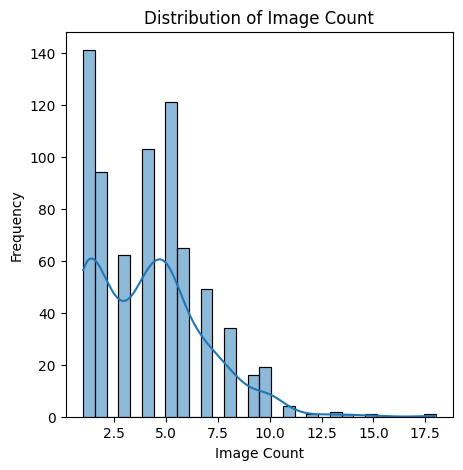

In [ ]:
for col in continuous_columns:
    plt.figure(figsize=(5, 5))
    sns.histplot(df2[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

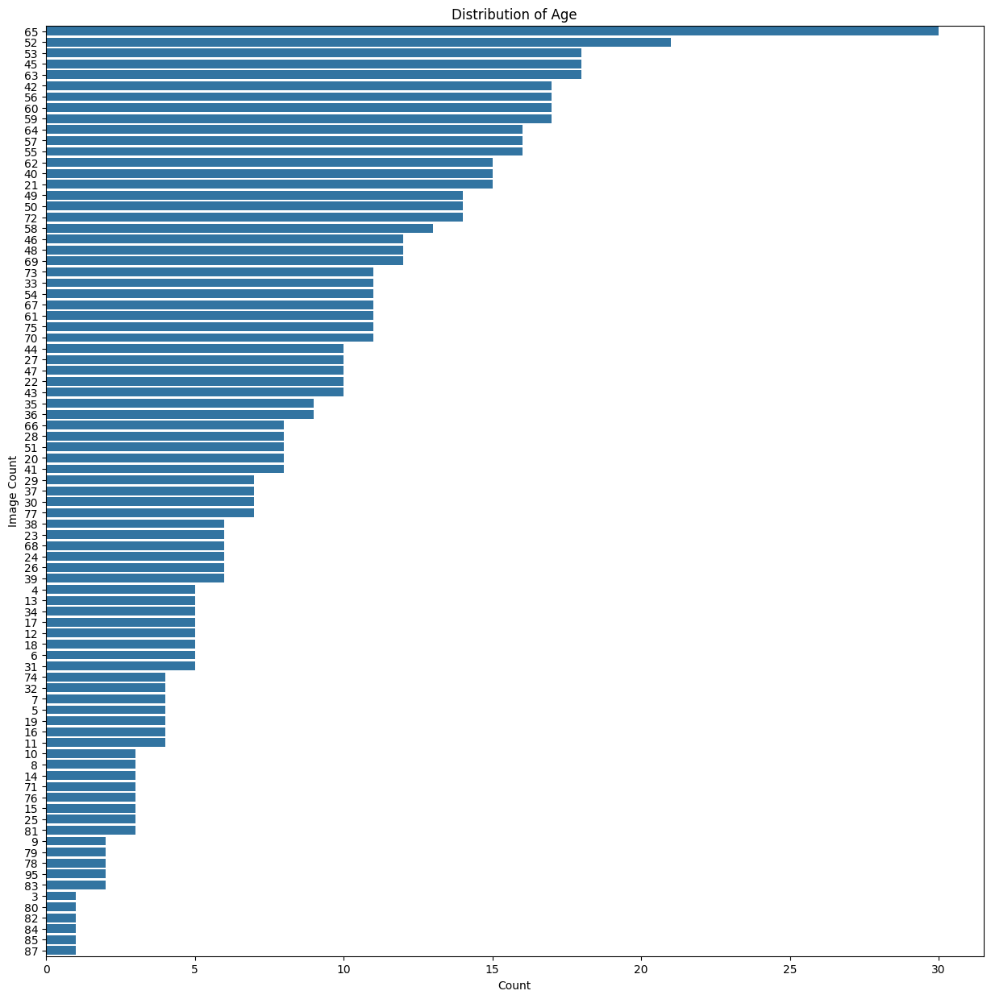

In [ ]:
plt.figure(figsize=(15,15))
sns.countplot(y=df2[categorical_columns[0]], order=df2 [categorical_columns[0]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[0]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

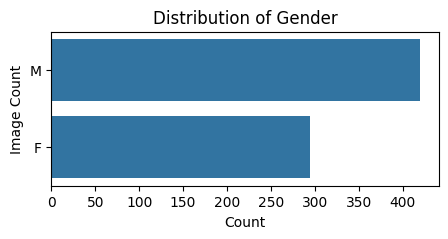

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[1]], order=df2 [categorical_columns[1]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[1]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

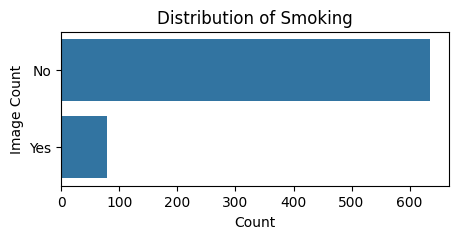

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[2]], order=df2 [categorical_columns[2]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[2]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

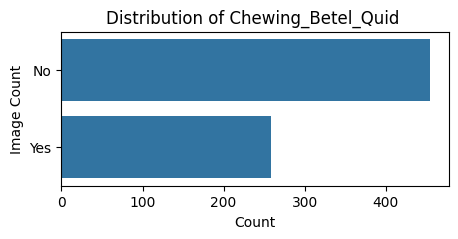

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[3]], order=df2 [categorical_columns[3]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[3]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

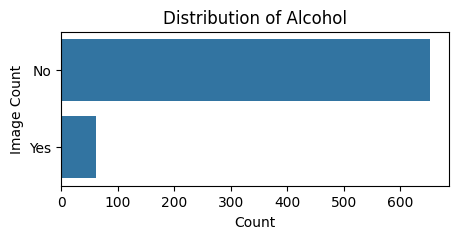

In [ ]:
plt.figure(figsize=(5,2))
sns.countplot(y=df2[categorical_columns[4]], order=df2 [categorical_columns[4]].value_counts().index)
plt.title(f'Distribution of {categorical_columns[4]}')
plt.xlabel('Count')
plt.ylabel(col)
plt.show()

---

#### Annotations

##### Load and Explore the Annotation JSON

In [ ]:
print("Loading annotation file...")
with open(ANNOTATION_FILE, 'r') as f:
    annotations = json.load(f)

print(f"Top-level keys in JSON: {annotations.keys()}")

Loading annotation file...
Top-level keys in JSON: dict_keys(['images', 'annotations', 'categories'])


In [ ]:
# Common keys in annotation formats:
# COCO: ['images', 'annotations', 'categories']

images_info      = annotations['images']
annotations_info = annotations['annotations']
categories_info  = annotations['categories']

print(f"Number of images: {len(images_info)}")
print(f"Number of annotations: {len(annotations_info)}")

Number of images: 3000
Number of annotations: 6358


In [ ]:
print("First image info:", images_info[0])

First image info: {'id': 1, 'file_name': 'R-01-01.jpg'}


In [ ]:
print(f"Categories: {categories_info}")

Categories: [{'id': 1, 'name': 'Lesion', 'supercategory': 'object'}, {'id': 2, 'name': 'Oral Cavity', 'supercategory': 'object'}]


In [ ]:
print("First annotation info:", annotations_info[0])

First annotation info: {'id': 1, 'image_id': 1, 'category_id': 1, 'bbox': [2574, 1739, 464, 562], 'segmentation': [2574, 1845, 2848, 1739, 3038, 2088, 2977, 2255, 2908, 2301, 2673, 2058], 'area': 6990438, 'iscrowd': 0}


In [ ]:
# Create a DataFrame to Link Everything
# Build a list of image data
image_data = []
for img_info in images_info:
    image_id = img_info['id']
    file_name = img_info['file_name']

    image_path = os.path.join(IMAGE_DIR, file_name)

    if not os.path.exists(image_path):
        print(f"Warning: Image file not found: {image_path}. Skipping.")
        continue

    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

    if img is None:
        print(f"Warning: Could not read image: {image_path}. Skipping.")
        continue

    height, width = img.shape[:2]

    image_data.append({
        'image_id': image_id,
        'file_name': file_name,
        'width': width,
        'height': height,
        'image_path': image_path # Store the full path
    })

df_images = pd.DataFrame(image_data)

if df_images.empty:
    raise ValueError("No valid images were found! Please check IMAGE_DIR path.")

In [ ]:
df_images.head()

,image_id,file_name,width,height,image_path
0,1,R-01-01.jpg,4608,3456,Images/R-01-01.jpg
1,2,R-01-02.jpg,4608,3456,Images/R-01-02.jpg
2,3,R-01-03.jpg,3456,4608,Images/R-01-03.jpg
3,4,R-02-01.jpg,4608,3456,Images/R-02-01.jpg
4,5,R-02-02.jpg,4608,3456,Images/R-02-02.jpg


In [ ]:
# Build a list of annotation data
annotation_data = []
for ann_info in annotations_info:
    annotation_data.append({
        'image_id': ann_info['image_id'],
        'category_id': ann_info['category_id'],
        'segmentation': ann_info['segmentation'],
        'area': ann_info['area'],
        'iscrowd': ann_info['iscrowd']
    })

df_annotations = pd.DataFrame(annotation_data)

In [ ]:
df_annotations.head()

,image_id,category_id,segmentation,area,iscrowd
0,1,1,"[2574, 1845, 2848, 1739, 3038, 2088, 2977, 225...",6990438,0
1,1,2,"[2125, 34, 1437, 439, 981, 1050, 860, 2039, 10...",15815990,0
2,2,2,"[318, 52, 310, 731, 620, 1704, 757, 2263, 800,...",15815990,0
3,2,1,"[3948, 1399, 3767, 1162, 3728, 1090, 3612, 110...",7041375,0
4,3,2,"[19, 1187, 19, 1755, 232, 2336, 439, 2949, 490...",10090416,0


In [ ]:
df = pd.merge(df_images, df_annotations, on='image_id', how='left')

In [ ]:
print(f"Merged DataFrame shape: {df.shape}\n")
df.head()

Merged DataFrame shape: (6358, 9)



,image_id,file_name,width,height,image_path,category_id,segmentation,area,iscrowd
0,1,R-01-01.jpg,4608,3456,Images/R-01-01.jpg,1,"[2574, 1845, 2848, 1739, 3038, 2088, 2977, 225...",6990438,0
1,1,R-01-01.jpg,4608,3456,Images/R-01-01.jpg,2,"[2125, 34, 1437, 439, 981, 1050, 860, 2039, 10...",15815990,0
2,2,R-01-02.jpg,4608,3456,Images/R-01-02.jpg,2,"[318, 52, 310, 731, 620, 1704, 757, 2263, 800,...",15815990,0
3,2,R-01-02.jpg,4608,3456,Images/R-01-02.jpg,1,"[3948, 1399, 3767, 1162, 3728, 1090, 3612, 110...",7041375,0
4,3,R-01-03.jpg,3456,4608,Images/R-01-03.jpg,2,"[19, 1187, 19, 1755, 232, 2336, 439, 2949, 490...",10090416,0


In [ ]:
# Check for images without annotations
missing_annotations = df['segmentation'].isnull().sum()
print(f"Number of images with missing annotations: {missing_annotations}")
if missing_annotations > 0:
    print("Dropping images with missing annotations...")
    df = df.dropna(subset=['segmentation']).copy()
    print(f"DataFrame shape after dropping: {df.shape}")

Number of images with missing annotations: 0


In [ ]:
# Load data
with open(ANNOTATION_FILE, 'r') as f:
    annotations = json.load(f)

df_imagewise_meta = pd.read_excel(IMAGEWISE_METADATA_FILE)

# Create necessary mappings
image_annotations_map = {}
for ann in annotations['annotations']:
    image_id = ann['image_id']
    if image_id not in image_annotations_map:
        image_annotations_map[image_id] = []
    image_annotations_map[image_id].append(ann)

file_to_image_map = {}
for img in annotations['images']:
    file_to_image_map[img['file_name']] = img

category_map = {cat['id']: cat['name'] for cat in annotations['categories']}

In [ ]:
# -------------------------------------------------------------------
# FUNCTION 1: Get Image IDs by Category
# -------------------------------------------------------------------
def get_images_by_category(category_value, category_column='Category',
                          diagnosis_column='Clinical Diagnosis', max_samples=10):
    """
    Get image IDs and metadata for images belonging to a specific category.
    """

    print(f"Looking for category: '{category_value}' in column: '{category_column}'")
    print(f"Available columns in metadata: {df_imagewise_meta.columns.tolist()}")

    # Create a mapping from filename without extension to metadata row
    metadata_map = {}
    for idx, row in df_imagewise_meta.iterrows():
        image_name = row['Image Name']
        # Remove .jpg if present, and also handle case where it might not be present
        image_name_clean = image_name.replace('.jpg', '').replace('.jpeg', '').replace('.png', '')
        metadata_map[image_name_clean] = row

    # Merge image data with metadata
    image_data = []
    matched_count = 0
    unmatched_count = 0

    for img in annotations['images']:
        file_name = img['file_name']
        image_id = img['id']

        # Clean the filename for matching (remove extension)
        file_name_clean = file_name.replace('.jpg', '').replace('.jpeg', '').replace('.png', '')

        # Get metadata for this image
        category = "Unknown"
        diagnosis = "Unknown"

        if file_name_clean in metadata_map:
            meta_row = metadata_map[file_name_clean]
            matched_count += 1

            if category_column in meta_row.index:
                category = meta_row[category_column]
                if pd.isna(category):  # Handle NaN values
                    category = "Unknown"
            if diagnosis_column in meta_row.index:
                diagnosis = meta_row[diagnosis_column]
                if pd.isna(diagnosis):  # Handle NaN values
                    diagnosis = "Unknown"
        else:
            unmatched_count += 1

        image_data.append({
            'image_id': image_id,
            'file_name': file_name,  # Keep original filename with extension for image loading
            'file_name_clean': file_name_clean,  # Clean version for reference
            'category': category,
            'diagnosis': diagnosis
        })

    print(f"Metadata matching: {matched_count} matched, {unmatched_count} unmatched")

    df_images_meta = pd.DataFrame(image_data)

    # Check what categories we have
    available_categories = df_images_meta['category'].unique()  # Use lowercase 'category'
    print(f"Available categories: {available_categories}")

    # Filter by category - use the correct column name from our created dataframe
    filtered_images = df_images_meta[df_images_meta['category'] == category_value]

    if filtered_images.empty:
        print(f"No images found for category: '{category_value}'")
        print(f"Available categories: {available_categories}")
        return []

    # Sample if there are too many images
    if len(filtered_images) > max_samples:
        filtered_images = filtered_images.sample(n=max_samples, random_state=42)
        print(f"Sampled {max_samples} images out of {len(filtered_images)} total for category '{category_value}'")
    else:
        print(f"Found {len(filtered_images)} images for category '{category_value}'")

    # Convert to list of dictionaries for easy processing
    result = filtered_images.to_dict('records')

    return result

In [ ]:
# -------------------------------------------------------------------
# FUNCTION 2: Visualize Annotations for Specific Image IDs
# -------------------------------------------------------------------
def visualize_annotations_for_images(image_list, category_value,
                                   category_colors=None,
                                   figsize=(15, 10)):
    """
    Visualize annotations for a list of images.

    Args:
        image_list (list): List of image metadata dictionaries from get_images_by_category()
        category_value (str): The category value being visualized (for title)
        category_colors (dict): Color mapping for annotation categories
        figsize (tuple): Figure size for the plot
    """

    if not image_list:
        print("No images to visualize.")
        return

    # Default colors for annotation categories
    if category_colors is None:
        category_colors = {
            1: 'red',      # Lesion - Red
            2: 'cyan'      # Oral Cavity - Cyan
        }

    num_images = len(image_list)
    cols = min(3, num_images)  # Maximum 3 columns
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Handle single image case
    if num_images == 1:
        axes = np.array([axes])
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)

    axes = axes.ravel()

    for i, image_info in enumerate(image_list):
        if i >= len(axes):
            break

        image_id = image_info['image_id']
        file_name = image_info['file_name']
        category = image_info['category']
        diagnosis = image_info['diagnosis']

        # Load and display the image
        image_path = os.path.join(IMAGE_DIR, file_name)
        image = cv2.imread(image_path)

        if image is None:
            print(f"Could not load image: {image_path}")
            axes[i].text(0.5, 0.5, f"Image not found:\n{file_name}",
                        ha='center', va='center', transform=axes[i].transAxes)
            axes[i].axis('off')
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[i].imshow(image)

        # Create title with image information
        title_parts = [f"ID: {image_id}", f"File: {file_name}"]
        if diagnosis != "Unknown":
            title_parts.append(f"Diagnosis: {diagnosis}")
        if category != "Unknown":
            title_parts.append(f"Category: {category}")

        axes[i].set_title('\n'.join(title_parts), fontsize=10, pad=10)

        # Draw annotations if they exist
        if image_id in image_annotations_map:
            annotations_list = image_annotations_map[image_id]

            legend_handles = []
            legend_labels = []

            for ann in annotations_list:
                category_id = ann['category_id']
                category_name = category_map.get(category_id, f'Class {category_id}')
                polygon_points = ann['segmentation']

                if not isinstance(polygon_points, list) or len(polygon_points) < 6:
                    continue

                # Reshape polygon points
                pts = np.array(polygon_points, dtype=np.float32).reshape((-1, 2))

                # Get color for this category
                color = category_colors.get(category_id, 'yellow')

                # Create polygon patch
                polygon = Polygon(pts, closed=True, fill=False,
                                edgecolor=color, linewidth=2.5, linestyle='-',
                                label=category_name)

                # Add to plot
                axes[i].add_patch(polygon)

                # Add to legend if not already present
                if category_name not in legend_labels:
                    legend_handles.append(polygon)
                    legend_labels.append(category_name)

            # Add legend if we have annotations
            if legend_handles:
                axes[i].legend(legend_handles, legend_labels, loc='upper right', fontsize=8)
        else:
            axes[i].text(0.5, 0.5, "No annotations",
                        ha='center', va='center', transform=axes[i].transAxes,
                        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))

        axes[i].axis('off')

    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Main title
    plt.suptitle(f'Annotations for Category: {category_value}\n'
                 f'Red: Lesion, Cyan: Oral Cavity',
                 fontsize=14, fontweight='bold', y=0.95)

    plt.tight_layout()
    plt.show()

    # Print summary
    print(f"\nVisualized {min(len(image_list), len(axes))} images for category: {category_value}")
    for image_info in image_list:
        image_id = image_info['image_id']
        if image_id in image_annotations_map:
            ann_count = len(image_annotations_map[image_id])
            lesion_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 1)
            oral_cavity_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 2)
            print(f"  Image {image_id}: {ann_count} annotations ({lesion_count} lesions, {oral_cavity_count} oral cavities)")

In [ ]:
# -------------------------------------------------------------------
# FUNCTION 2: Visualize Annotations for Specific Image IDs
# -------------------------------------------------------------------
def visualize_annotations_for_images(image_list, category_value,
                                   category_colors=None,
                                   figsize=(15, 10)):
    """
    Visualize annotations for a list of images.
    """

    if not image_list:
        print("No images to visualize.")
        return

    # Default colors for annotation categories
    if category_colors is None:
        category_colors = {
            1: 'red',      # Lesion - Red
            2: 'cyan'      # Oral Cavity - Cyan
        }

    num_images = len(image_list)
    cols = min(3, num_images)  # Maximum 3 columns
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Handle single image case
    if num_images == 1:
        axes = np.array([axes])
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)

    axes = axes.ravel()

    for i, image_info in enumerate(image_list):
        if i >= len(axes):
            break

        image_id = image_info['image_id']
        file_name = image_info['file_name']
        category = image_info['category']
        diagnosis = image_info['diagnosis']

        # Load and display the image
        image_path = os.path.join(IMAGE_DIR, file_name)
        image = cv2.imread(image_path)

        if image is None:
            print(f"Could not load image: {image_path}")
            axes[i].text(0.5, 0.5, f"Image not found:\n{file_name}",
                        ha='center', va='center', transform=axes[i].transAxes)
            axes[i].axis('off')
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[i].imshow(image)

        # Create title with image information
        title_parts = [f"ID: {image_id}", f"File: {file_name}"]
        if diagnosis != "Unknown":
            title_parts.append(f"Diagnosis: {diagnosis}")
        if category != "Unknown":
            title_parts.append(f"Category: {category}")

        axes[i].set_title('\n'.join(title_parts), fontsize=10, pad=10)

        # Draw annotations if they exist
        if image_id in image_annotations_map:
            annotations_list = image_annotations_map[image_id]

            legend_handles = []
            legend_labels = []

            for ann in annotations_list:
                category_id = ann['category_id']
                category_name = category_map.get(category_id, f'Class {category_id}')
                polygon_points = ann['segmentation']

                if not isinstance(polygon_points, list) or len(polygon_points) < 6:
                    continue

                # Reshape polygon points
                pts = np.array(polygon_points, dtype=np.float32).reshape((-1, 2))

                # Get color for this category
                color = category_colors.get(category_id, 'yellow')

                # Create polygon patch
                polygon = Polygon(pts, closed=True, fill=False,
                                edgecolor=color, linewidth=2.5, linestyle='-',
                                label=category_name)

                # Add to plot
                axes[i].add_patch(polygon)

                # Add to legend if not already present
                if category_name not in legend_labels:
                    legend_handles.append(polygon)
                    legend_labels.append(category_name)

            # Add legend if we have annotations
            if legend_handles:
                axes[i].legend(legend_handles, legend_labels, loc='upper right', fontsize=8)
        else:
            axes[i].text(0.5, 0.5, "No annotations",
                        ha='center', va='center', transform=axes[i].transAxes,
                        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))

        axes[i].axis('off')

    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    # Main title
    plt.suptitle(f'Annotations for Category: {category_value}\n'
                 f'Red: Lesion, Cyan: Oral Cavity\n\n',
                 fontsize=14, fontweight='bold', y=0.95)

    plt.tight_layout()
    plt.show()

    # Print summary
    print(f"\nVisualized {min(len(image_list), len(axes))} images for category: {category_value}")
    for image_info in image_list:
        image_id = image_info['image_id']
        if image_id in image_annotations_map:
            ann_count = len(image_annotations_map[image_id])
            lesion_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 1)
            oral_cavity_count = sum(1 for ann in image_annotations_map[image_id] if ann['category_id'] == 2)
            print(f"  Image {image_id}: {ann_count} annotations ({lesion_count} lesions, {oral_cavity_count} oral cavities)")

In [ ]:
# -------------------------------------------------------------------
# EXPLORE AVAILABLE CATEGORIES
# -------------------------------------------------------------------
def explore_available_categories():
    """First, let's see what categories and values are available"""
    print("=== EXPLORING AVAILABLE DATA ===")
    print("Columns in metadata file:", df_imagewise_meta.columns.tolist())

    # Check unique values in Category column
    if 'Category' in df_imagewise_meta.columns:
        print("\nUnique values in 'Category' column:")
        category_counts = df_imagewise_meta['Category'].value_counts()
        print(category_counts)

        # Show the actual values (in case there are spaces or case differences)
        print("\nActual category values:")
        for category in df_imagewise_meta['Category'].unique():
            print(f"  '{category}'")

    # Check sample rows
    print("\nSample of metadata (first 5 rows):")
    print(df_imagewise_meta[['Image Name', 'Category', 'Clinical Diagnosis']].head(10))

# Run exploration
explore_available_categories()

=== EXPLORING AVAILABLE DATA ===
Columns in metadata file: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']

Unique values in 'Category' column:
Category
OPMD       1394
Benign      748
Healthy     729
OCA         129
Name: count, dtype: int64

Actual category values:
  'OPMD'
  'Benign'
  'Healthy'
  'OCA'

Sample of metadata (first 5 rows):
  Image Name Category Clinical Diagnosis
0    R-01-01     OPMD        Leukoplakia
1    R-01-02     OPMD        Leukoplakia
2    R-01-03   Benign      Coated Tongue
3    R-02-01   Benign                VBD
4    R-02-02   Benign                VBD
5    R-02-03   Benign                VBD
6    R-02-04   Benign                VBD
7    R-02-05  Healthy      Normal Mucosa
8    R-02-06  Healthy      Normal Mucosa
9    R-02-07  Healthy      Normal Mucosa


Looking for category: 'OPMD' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'OPMD'
Successfully found images for category: 'OPMD'


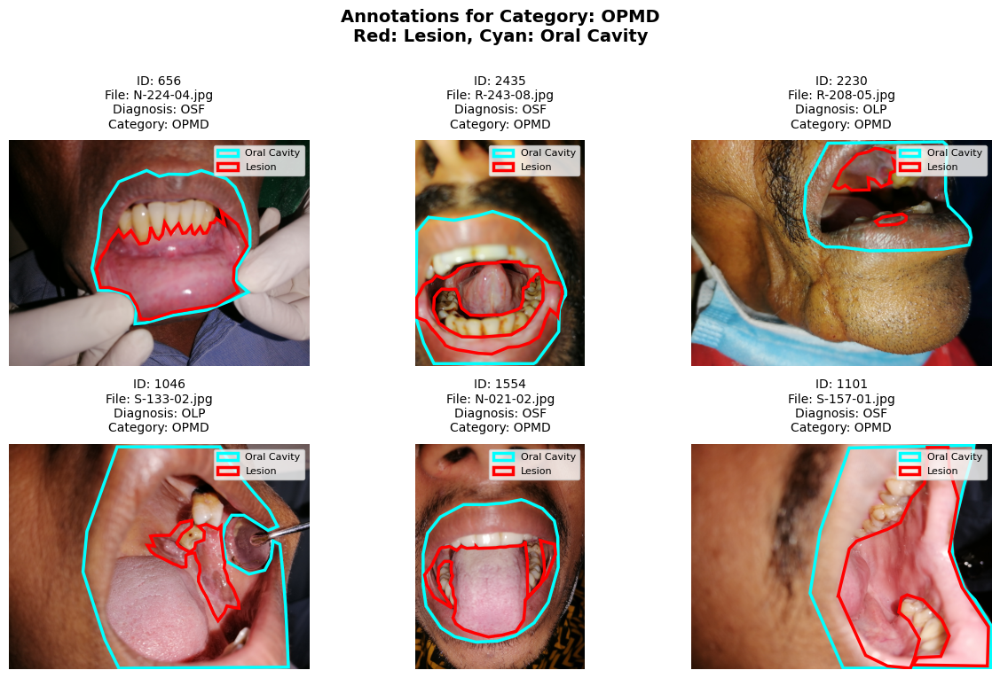


Visualized 6 images for category: OPMD
  Image 656: 2 annotations (1 lesions, 1 oral cavities)
  Image 2435: 2 annotations (1 lesions, 1 oral cavities)
  Image 2230: 3 annotations (2 lesions, 1 oral cavities)
  Image 1046: 2 annotations (1 lesions, 1 oral cavities)
  Image 1554: 2 annotations (1 lesions, 1 oral cavities)
  Image 1101: 2 annotations (1 lesions, 1 oral cavities)


In [ ]:
category ='OPMD'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

Looking for category: 'Benign' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'Benign'
Successfully found images for category: 'Benign'


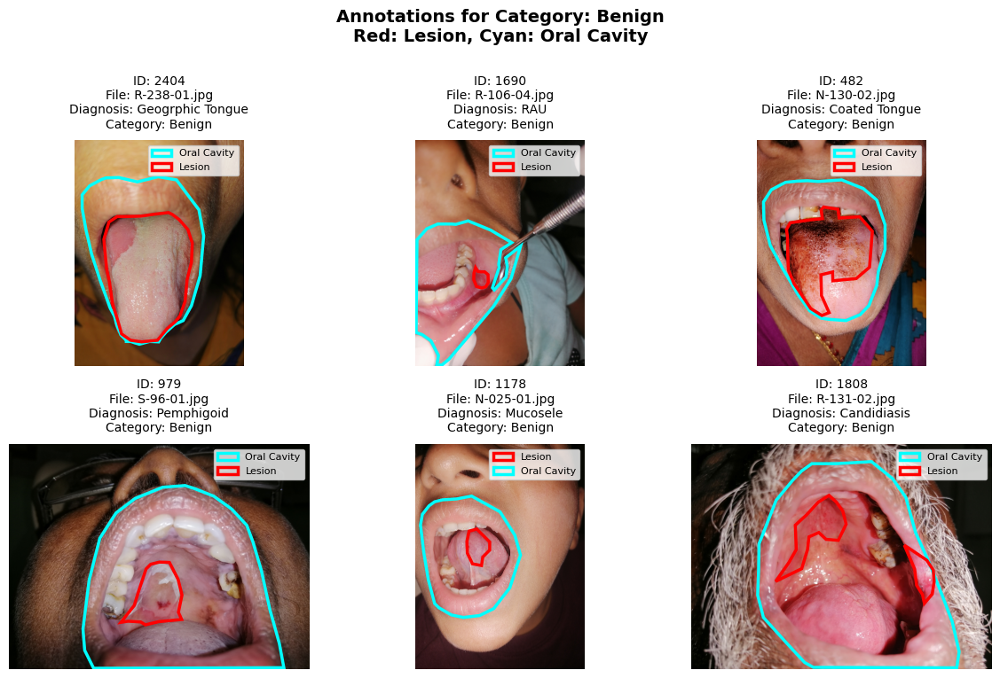


Visualized 6 images for category: Benign
  Image 2404: 2 annotations (1 lesions, 1 oral cavities)
  Image 1690: 2 annotations (1 lesions, 1 oral cavities)
  Image 482: 2 annotations (1 lesions, 1 oral cavities)
  Image 979: 2 annotations (1 lesions, 1 oral cavities)
  Image 1178: 2 annotations (1 lesions, 1 oral cavities)
  Image 1808: 3 annotations (2 lesions, 1 oral cavities)


In [ ]:
category ='Benign'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

Looking for category: 'Healthy' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'Healthy'
Successfully found images for category: 'Healthy'


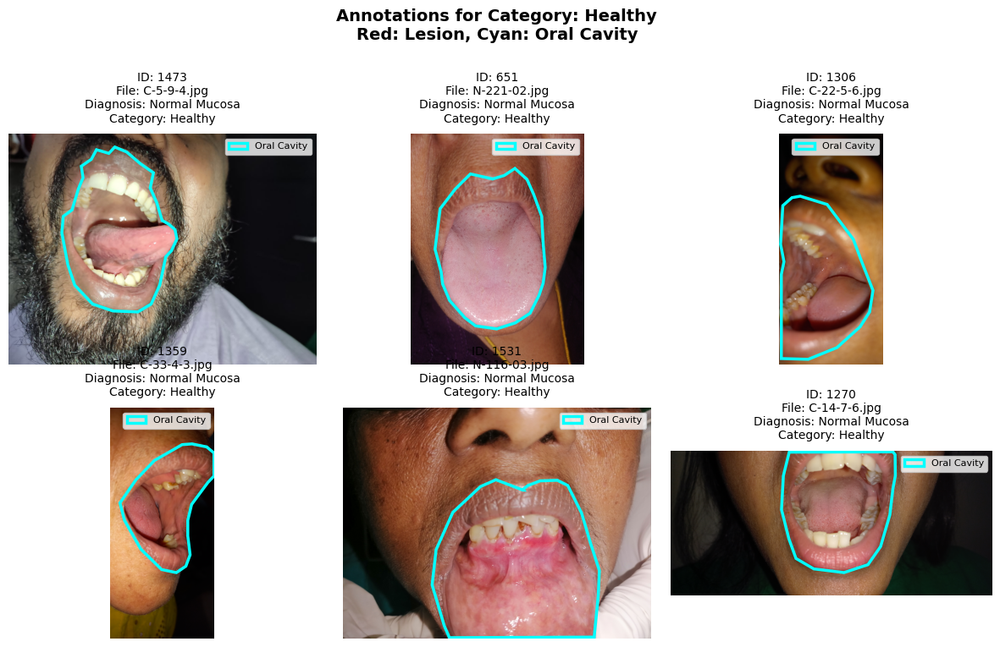


Visualized 6 images for category: Healthy
  Image 1473: 1 annotations (0 lesions, 1 oral cavities)
  Image 651: 1 annotations (0 lesions, 1 oral cavities)
  Image 1306: 1 annotations (0 lesions, 1 oral cavities)
  Image 1359: 1 annotations (0 lesions, 1 oral cavities)
  Image 1531: 1 annotations (0 lesions, 1 oral cavities)
  Image 1270: 1 annotations (0 lesions, 1 oral cavities)


In [ ]:
category ='Healthy'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

Looking for category: 'OCA' in column: 'Category'
Available columns in metadata: ['Image Name', 'Category', 'Clinical Diagnosis', 'Lesion Annotation Count']
Metadata matching: 3000 matched, 0 unmatched
Available categories: ['OPMD' 'Benign' 'Healthy' 'OCA']
Sampled 6 images out of 6 total for category 'OCA'
Successfully found images for category: 'OCA'


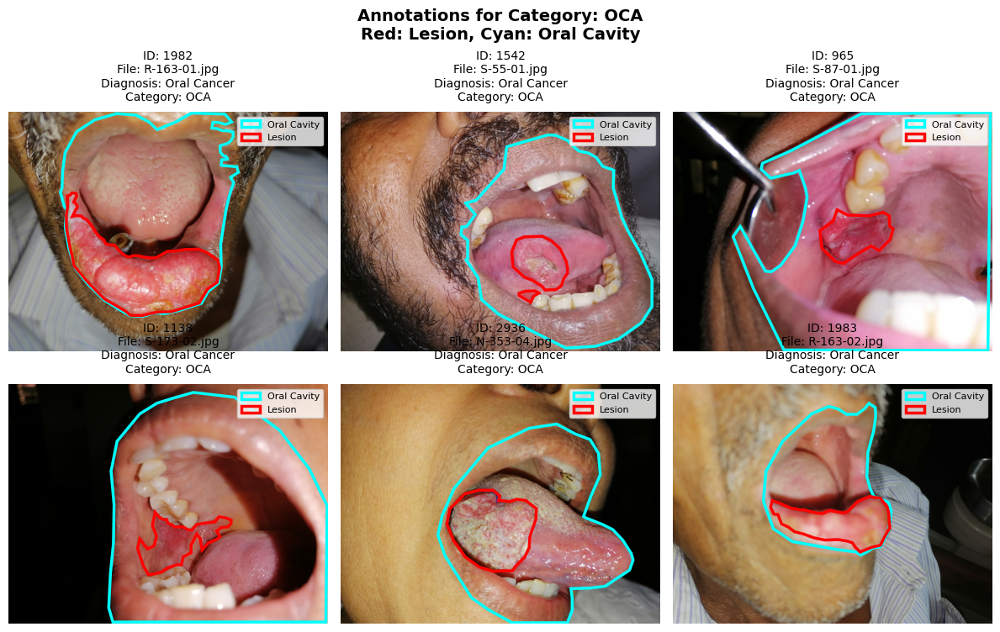


Visualized 6 images for category: OCA
  Image 1982: 2 annotations (1 lesions, 1 oral cavities)
  Image 1542: 3 annotations (2 lesions, 1 oral cavities)
  Image 965: 2 annotations (1 lesions, 1 oral cavities)
  Image 1138: 2 annotations (1 lesions, 1 oral cavities)
  Image 2936: 2 annotations (1 lesions, 1 oral cavities)
  Image 1983: 2 annotations (1 lesions, 1 oral cavities)


In [ ]:
category ='OCA'
opmd_images = get_images_by_category(category,
                                       category_column='Category',
                                       diagnosis_column='Clinical Diagnosis',
                                       max_samples=6)

if opmd_images:
    print(f"Successfully found images for category: '{category}'")
    visualize_annotations_for_images(opmd_images, category,
                                    category_colors=None,
                                    figsize=(12, 8))
else:
    print(f"No images found for category: '{category}'")

if not opmd_images:
    print("\nCould not find any OPMD images. Please check the category values above.")
    print("You may need to use the exact value shown in the exploration output.")

---

#### Removing "Benign" and "OSF" images from the Image folder

In [ ]:
#### Moving "Benign" images into a different folder

BENIGN_IMAGES_DIR = os.path.join(DATA_DIR, "Benign")

os.makedirs(BENIGN_IMAGES_DIR, exist_ok=True)

df = pd.read_excel(IMAGEWISE_METADATA_FILE)

# Filter for Benign images
benign_images = df[df['Category'] == 'Benign']

print(f"Found {len(benign_images)} Benign images")

# Move Benign images to the new folder
moved_count = 0
error_count = 0

for index, row in benign_images.iterrows():
    try:
        image_name = row['Image Name']
        if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_name += '.jpg'

        source_path = os.path.join(IMAGE_DIR, image_name)
        destination_path = os.path.join(BENIGN_IMAGES_DIR, image_name)

        # Check if source file exists
        if os.path.exists(source_path):
            # MOVE the file
            shutil.move(source_path, destination_path)
            moved_count += 1
            print(f" Moved: {image_name}")
        else:
            print(f" File not found: {image_name}")
            error_count += 1

    except Exception as e:
        print(f" Error moving {row['Image Name']}: {e}")
        error_count += 1

print(f"\n{'='*50}")
print(f"MOVING COMPLETED!")
print(f"{'='*50}")
print(f"Successfully moved: {moved_count} images")
print(f"Errors: {error_count} images")
print(f"Benign images moved to: {BENIGN_IMAGES_DIR}")

Found 748 Benign images
 Moved: R-01-03.jpg
 Moved: R-02-01.jpg
 Moved: R-02-02.jpg
 Moved: R-02-03.jpg
 Moved: R-02-04.jpg
 Moved: R-03-02.jpg
 Moved: R-03-03.jpg
 Moved: R-03-04.jpg
 Moved: R-04-01.jpg
 Moved: R-04-02.jpg
 Moved: R-06-01.jpg
 Moved: R-06-02.jpg
 Moved: R-06-03.jpg
 Moved: R-11-02.jpg
 Moved: R-11-03.jpg
 Moved: R-11-04.jpg
 Moved: R-13-04.jpg
 Moved: R-14-01.jpg
 Moved: R-19-01.jpg
 Moved: R-22-02.jpg
 Moved: R-22-03.jpg
 Moved: R-22-04.jpg
 Moved: R-23-01.jpg
 Moved: R-23-03.jpg
 Moved: R-23-04.jpg
 Moved: R-23-05.jpg
 Moved: R-29-01.jpg
 Moved: R-29-03.jpg
 Moved: R-29-04.jpg
 Moved: R-30-01.jpg
 Moved: R-31-01.jpg
 Moved: R-31-02.jpg
 Moved: R-32-01.jpg
 Moved: R-32-03.jpg
 Moved: R-33-01.jpg
 Moved: R-33-02.jpg
 Moved: R-36-01.jpg
 Moved: R-36-02.jpg
 Moved: R-36-03.jpg
 Moved: R-36-04.jpg
 Moved: R-39-01.jpg
 Moved: R-40-01.jpg
 Moved: R-40-02.jpg
 Moved: R-42-01.jpg
 Moved: R-42-02.jpg
 Moved: R-42-03.jpg
 Moved: R-42-04.jpg
 Moved: R-42-05.jpg
 Moved: R-42-06.

In [ ]:
filelist = os.listdir(IMAGE_DIR)
print(len(filelist))

2252


In [ ]:
#### Moving "OSF" images into a different folder


OSF_IMAGES_DIR = os.path.join(DATA_DIR, "OSF")

os.makedirs(OSF_IMAGES_DIR, exist_ok=True)

# Load the imagewise data
df = pd.read_excel(IMAGEWISE_METADATA_FILE)

# Filter for OSF images
OSF_images = df[df['Clinical Diagnosis'] == 'OSF']

print(f"Found {len(OSF_images)} OSF images")

# Move OSF images to the new folder
moved_count = 0
error_count = 0

for index, row in OSF_images.iterrows():
    try:
        image_name = row['Image Name']
        if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_name += '.jpg'

        source_path = os.path.join(IMAGE_DIR, image_name)
        destination_path = os.path.join(OSF_IMAGES_DIR, image_name)

        # Check if source file exists
        if os.path.exists(source_path):
            # MOVE the file
            shutil.move(source_path, destination_path)
            moved_count += 1
            print(f" Moved: {image_name}")
        else:
            print(f" File not found: {image_name}")
            error_count += 1

    except Exception as e:
        print(f" Error moving {row['Image Name']}: {e}")
        error_count += 1

print(f"\n{'='*50}")
print(f"MOVING COMPLETED!")
print(f"{'='*50}")
print(f"Successfully moved: {moved_count} images")
print(f"Errors: {error_count} images")
print(f"OSF images moved to: {OSF_IMAGES_DIR}")

Found 684 OSF images
 Moved: R-09-01.jpg
 Moved: R-09-02.jpg
 Moved: R-09-03.jpg
 Moved: R-09-04.jpg
 Moved: R-09-05.jpg
 Moved: R-09-06.jpg
 Moved: R-09-07.jpg
 Moved: R-09-08.jpg
 Moved: R-09-09.jpg
 Moved: R-10-02.jpg
 Moved: R-10-03.jpg
 Moved: R-12-01.jpg
 Moved: R-12-02.jpg
 Moved: R-12-03.jpg
 Moved: R-17-01.jpg
 Moved: R-17-02.jpg
 Moved: R-17-03.jpg
 Moved: R-17-04.jpg
 Moved: R-17-05.jpg
 Moved: R-21-01.jpg
 Moved: R-21-02.jpg
 Moved: R-21-03.jpg
 Moved: R-21-04.jpg
 Moved: R-21-05.jpg
 Moved: R-21-06.jpg
 Moved: R-21-07.jpg
 Moved: R-24-01.jpg
 Moved: R-24-02.jpg
 Moved: R-24-03.jpg
 Moved: R-24-04.jpg
 Moved: R-24-05.jpg
 Moved: R-24-06.jpg
 Moved: R-24-07.jpg
 Moved: R-34-01.jpg
 Moved: R-34-02.jpg
 Moved: R-34-04.jpg
 Moved: R-45-02.jpg
 Moved: R-45-04.jpg
 Moved: R-52-01.jpg
 Moved: R-52-02.jpg
 Moved: R-52-03.jpg
 Moved: R-52-04.jpg
 Moved: R-52-05.jpg
 Moved: R-52-06.jpg
 Moved: R-56-01.jpg
 Moved: R-56-02.jpg
 Moved: R-56-03.jpg
 Moved: R-56-04.jpg
 Moved: R-56-05.jpg

In [ ]:
filelist = os.listdir(IMAGE_DIR)
print(len(filelist))

1568


---

#### Data Preparation and Preprocessing

In [ ]:
def get_image_size_stats(image_dir):
  heights, widths = [], []

  for filename in os.listdir(image_dir):
    if filename.lower().endswith(('.jpg','.jpeg','.png','.bmp')):
      path = os.path.join(image_dir, filename)
      try:
        img = Image.open(path)
        w,h = img.size
        widths.append(w)
        heights.append(h)
      except Exception as e:
        print(f"Skipping {filename}:{e}")
        continue

  print(f"Number of images scanned: {len(heights)}")
  print(f"Height: min= {min(heights)}, max={max(heights)}")
  print(f"Width: min={min(widths)}, max={max(widths)}")

In [ ]:
get_image_size_stats(IMAGE_DIR)

Number of images scanned: 1568
Height: min= 960, max=4608
Width: min=654, max=4608


In [ ]:
df1 = pd.read_excel(IMAGEWISE_METADATA_FILE)
print(f"Original data shape:",{df1.shape})

Original data shape: {(3000, 4)}


In [ ]:
# Filter only the train images
train_images = set([f for f in os.listdir(IMAGE_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
df_cleaned   = df1[df1['Image Name'].apply(lambda x: x in train_images or
                                      any(x + ext in train_images for ext in ['.jpg', '.jpeg', '.png']))]

print(f"Total images for classification: {len(df_cleaned)}")

Total images for classification: 1568


In [ ]:
df_cleaned.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
7,R-02-05,Healthy,Normal Mucosa,0
8,R-02-06,Healthy,Normal Mucosa,0
9,R-02-07,Healthy,Normal Mucosa,0


In [ ]:
df_cleaned = df_cleaned.reset_index(drop=True)

In [ ]:
df_cleaned.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count
0,R-01-01,OPMD,Leukoplakia,1
1,R-01-02,OPMD,Leukoplakia,1
2,R-02-05,Healthy,Normal Mucosa,0
3,R-02-06,Healthy,Normal Mucosa,0
4,R-02-07,Healthy,Normal Mucosa,0


In [ ]:
len(df_cleaned)

1568

In [ ]:
df_cleaned.to_excel(os.path.join(DATA_DIR,'Imagewise_Data_cleaned.xlsx'), index=False)
print("DataFrame saved as 'Imagewise_Data_cleaned.xlsx'")

DataFrame saved as 'Imagewise_Data_cleaned.xlsx'


In [ ]:
print("Count of each Category in the dataset:\n")
category_counts = df_cleaned['Category'].value_counts()
print(category_counts)

Count of each Category in the dataset:

Category
Healthy    729
OPMD       710
OCA        129
Name: count, dtype: int64


In [ ]:
print("Percentage of each Category in the dataset:\n")
print((df_cleaned['Category'].value_counts()/df_cleaned['Category'].value_counts().sum())*100)
print("\nImbalance Ratio:", df_cleaned['Category'].value_counts().max()/ df_cleaned['Category'].value_counts().min())

Percentage of each Category in the dataset:

Category
Healthy    46.492347
OPMD       45.280612
OCA         8.227041
Name: count, dtype: float64

Imbalance Ratio: 5.651162790697675


* From the above results it is clear that the dataset is imbalanced (Imbalance Ratio: ~ 6:1)
* To address this we can use data augmentation or loss functions like "Focal Loss", "Weighted Cross Entropy Loss"

In [ ]:
print("\nClinical Diagnosis distribution:")
diagnosis_counts = df_cleaned['Clinical Diagnosis'].value_counts()
print(diagnosis_counts)


Clinical Diagnosis distribution:
Clinical Diagnosis
Normal Mucosa                         727
OLP                                   358
Oral Cancer                           125
OLP/LR                                 78
Leukoplakia                            69
OLP/ LR                                40
Leukplakia                             19
Erythroplakia                          14
PVL                                    14
Leukoplakia + OSF                      12
OLP /LR                                11
OLP/ PVL                                9
Early OSF                               9
OLP/DLE                                 9
Leukplakia + OSF                        7
Leukoplakia/ Candidiasis                6
Homogenous Leukoplakia                  6
Erythroleukoplakia                      5
Non-Homogenous Leukoplia                4
Erythroplakia + OSF                     4
Erythroplkia                            3
OLP + Coated Tongue                     3
OLP (Erosive)          

In [ ]:
print("Clinical Diagnosis types in the Dataset:")
print(len(df_cleaned['Clinical Diagnosis'].unique()))

Clinical Diagnosis types in the Dataset:
47


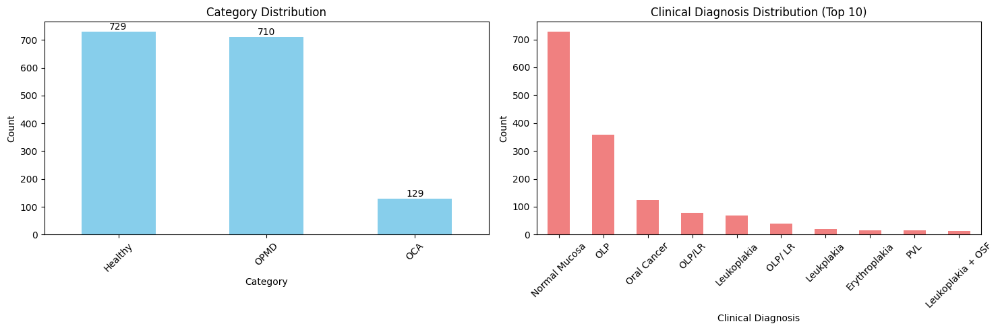

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))

# category distribution
category_counts.plot(kind='bar', ax=ax1, color='skyblue')
ax1.set_title('Category Distribution')
ax1.set_xlabel('Category')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)

# Add count labels on bars
for i, count in enumerate(category_counts):
  ax1.text(i, count+0.1, str(count), ha='center', va='bottom')

# Clinical Diagnosis distribution(top 10)
diagnosis_counts.head(10).plot(kind='bar', ax=ax2, color='lightcoral')
ax2.set_title('Clinical Diagnosis Distribution (Top 10)')
ax2.set_xlabel('Clinical Diagnosis')
ax2.set_ylabel('Count')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

#### Custom Dataset Class

In [30]:
class OralClassificationDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform):

      """
      Args:
          dataframe: DataFrame with image metadata
          image_dir: Directory containing images
          transform: PyTorch transforms
      """

      self.dataframe = dataframe.reset_index(drop=True)
      self.image_dir = image_dir
      self.transform = transform

      # Encode labels
      self.label_encoder = LabelEncoder()
      self.labels  = self.label_encoder.fit_transform(dataframe['Category'])   # fit: Finds all unique values and sorts them alphabetically (for strings, transform() : Maps each original value to its index in the sorted list
      self.classes = self.label_encoder.classes_    # After calling fit_transform(), self.label_encoder.classes_ automatically contains all the unique class names sorted in order
      self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

      # Get the split name (train/val/test) from dataframe
      if "Split" in dataframe.columns:
          split = dataframe["Split"].unique()
          if len(split) == 1:
              split = split[0].upper()
          else:
              split = ",".join(split).upper()
      else:
          split = "UNKNOWN"

      print(f"{split} Dataset initialized with {len(self.labels)} samples")
      print(f"Classes: {self.classes}")
      print(f"Class mapping:{self.class_to_idx}\n")

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):

      img_name = self.dataframe.iloc[idx]['Image Name']
      img_path = None

      # Handle file extensions
      img_path = os.path.join(self.image_dir, img_name)

      for ext in ['.jpg', '.jpeg', '.png']:
        path = os.path.join(self.image_dir, img_name + ext)
        if os.path.exists(path):
            img_path = path
            break

      if img_path is None:
        raise FileNotFoundError(f"No image found for {img_name} in {self.image_dir}")


      # Load and preprocess image
      image = Image.open(img_path).convert('RGB')

      if self.transform:
          image = self.transform(image)
      else:
          image = transforms.ToTensor()(image)

      label = self.labels[idx]

      return image, label, img_name

    def get_class_weights(self):
      """Calculate class weights for handling imbalance"""
      class_counts = np.bincount(self.labels)
      total = len(self.labels)
      class_weights = torch.FloatTensor(total / (len(class_counts) * class_counts))
      return class_weights

    def get_class_distribution(self):
      "Get the distribution of classes"
      unique, counts = np.unique(self.labels, return_counts = True)
      return dict(zip(self.classes[unique], counts))

## Training on CROPPED, RESIZED Images

##### Tight crop of oral cavity regions

In [6]:
TARGET_SIZE =(224,224)

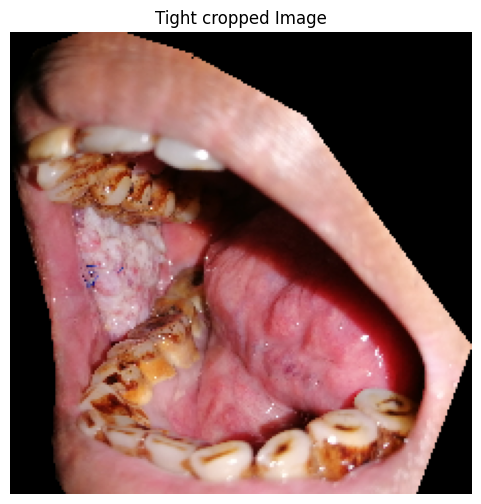

In [ ]:
dir = './a'
os.makedirs(dir,exist_ok=True)

# Path to image
image_path = "S-181-01.jpg"
image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(f"Error: Could not read image from '{image_path}'")

height, width = image.shape[:2]
mask = np.zeros((height, width), dtype=np.uint8)

# Draw the oral cavity polygon
polygon_points = [2581, 620, 2616, 585, 3318, 977, 3924, 1824, 4385, 2471, 4213,
                2939, 4027, 3435, 1776, 3428, 1721, 3332, 1693, 3098, 1721, 2698,
                1680, 2265, 1535, 1735, 1425, 1253, 1439, 785, 1590,
                544, 1872, 427, 2154, 427, 2602,571]

if isinstance(polygon_points, list) and len(polygon_points) >= 6:
  pts = np.array(polygon_points, dtype=np.int32).reshape((-1, 2))
  cv2.fillPoly(mask, [pts], color=255)

  # Apply mask to image (keep only oral cavity)
  masked_img = cv2.bitwise_and(image, image, mask=mask)

  # Find nonzero region of mask (tight crop)
  ys, xs = np.where(mask > 0)

  if len(xs) == 0 or len(ys) == 0:
      print(f"No mask pixels found for {file_name}")

  x_min, x_max = np.min(xs), np.max(xs)
  y_min, y_max = np.min(ys), np.max(ys)

  # Crop using exact nonzero region
  cropped_img = masked_img[y_min:y_max, x_min:x_max]

  # Resize to target size
  resized_img = cv2.resize(cropped_img, TARGET_SIZE)

   # Convert BGR → RGB for Matplotlib display
  image_rgb = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)

  # Show image
  plt.figure(figsize=(6,6))
  plt.imshow(image_rgb)
  plt.axis("off")
  plt.title("Tight cropped Image")
  plt.show()

In [7]:
TIGHT_CROPPED_IMAGES_DIR = os.path.join(DATA_DIR, "tight_cropped_oral_cavity_images")
os.makedirs(TIGHT_CROPPED_IMAGES_DIR, exist_ok = True)

In [8]:
def tight_crop_oral_cavity_regions(img_oral_cavity_annotation_map, img_id_to_file,
                                    IMAGE_DIR, TIGHT_CROPPED_IMAGES_DIR, TARGET_SIZE):
    """Crop precisely around the oral cavity segmentation mask (no extra padding)."""


    print("Cropping Oral Cavity Regions (mask-based tight crop)")
    processed_count = 0
    error_count = 0

    for image_id, ann in img_oral_cavity_annotation_map.items():
        try:
            file_name = img_id_to_file[image_id]
            img_path  = os.path.join(IMAGE_DIR, file_name)

            image = cv2.imread(img_path)
            if image is None:
                print(f"Could not load image: {file_name}")
                error_count += 1
                continue

            height, width = image.shape[:2]
            mask = np.zeros((height, width), dtype=np.uint8)

            polygon_points = ann['segmentation']
            if isinstance(polygon_points, list) and len(polygon_points) >= 6:
                pts = np.array(polygon_points, dtype=np.int32).reshape((-1, 2))
                cv2.fillPoly(mask, [pts], color=255)

                # Apply mask to image (keep only oral cavity)
                masked_img = cv2.bitwise_and(image, image, mask=mask)

                # Find nonzero region of mask (tight crop)
                ys, xs = np.where(mask > 0)
                if len(xs) == 0 or len(ys) == 0:
                    print(f"No mask pixels found for {file_name}")
                    error_count += 1
                    continue

                x_min, x_max = np.min(xs), np.max(xs)
                y_min, y_max = np.min(ys), np.max(ys)

                # Crop using exact nonzero region
                cropped_img = masked_img[y_min:y_max, x_min:x_max]

                # Resize to target size
                resized_img = cv2.resize(cropped_img, TARGET_SIZE)

                base_name = os.path.splitext(file_name)[0]
                output_filename = f"{base_name}.jpg"
                output_path = os.path.join(TIGHT_CROPPED_IMAGES_DIR, output_filename)
                cv2.imwrite(output_path, resized_img)

                processed_count += 1

                if processed_count % 100 == 0:
                    print(f"Processed {processed_count} images...")

            else:
                print(f"Invalid polygon for: {file_name}")
                error_count += 1

        except Exception as e:
            print(f"Error processing {file_name}: {e}")
            error_count += 1

    print(f"\nCropping completed")
    print(f"Processed: {processed_count}, Errors: {error_count}")
    print(f"Cropped images saved to: {TIGHT_CROPPED_IMAGES_DIR}")

In [9]:
# Load data
with open(ANNOTATION_FILE, 'r') as f:
    annotations = json.load(f)

In [10]:
img_id_to_file = {}
for img in annotations['images']:
  img_id_to_file[img['id']]= img['file_name']

In [11]:
img_oral_cavity_annotation_map = {}
for ann in annotations['annotations']:
  img_id = ann['image_id']
  file_name = img_id_to_file[img_id]
  if file_name in os.listdir(IMAGE_DIR):
    if ann['category_id'] == 2:  # Oral cavity
      img_oral_cavity_annotation_map[img_id] = ann

In [12]:
len(img_oral_cavity_annotation_map)

1568

In [13]:
tight_crop_oral_cavity_regions(img_oral_cavity_annotation_map, img_id_to_file,
                                IMAGE_DIR, TIGHT_CROPPED_IMAGES_DIR, TARGET_SIZE)

Cropping Oral Cavity Regions (mask-based tight crop)
Processed 100 images...
Processed 200 images...
Processed 300 images...
Processed 400 images...
Processed 500 images...
Processed 600 images...
Processed 700 images...
Processed 800 images...
Processed 900 images...
Processed 1000 images...
Processed 1100 images...
Processed 1200 images...
Processed 1300 images...
Processed 1400 images...
Processed 1500 images...

Cropping completed
Processed: 1568, Errors: 0
Cropped images saved to: /content/drive/MyDrive/DH_307/OPMD_DATASET/tight_cropped_oral_cavity_images


#### Splitting the data

* The data was split at the "patient level" i.e., all the images of a patient will only be in one of train, val, test split

In [14]:
df_cleaned_path = os.path.join(DATA_DIR, 'Imagewise_Data_cleaned.xlsx')

In [15]:
df = pd.read_excel(df_cleaned_path)

In [16]:
len(df)

1568

In [17]:
# Extract patient IDs
df['Patient ID'] = df['Image Name'].apply(lambda x: '-'.join(x.split('-')[:2]))

In [18]:
# Get unique patients
unique_patients  = df['Patient ID'].unique()

In [19]:
# split patients
train_patients, temp_patients = train_test_split(unique_patients, test_size=0.3, random_state=42)
val_patients,   test_patients = train_test_split(temp_patients,   test_size=0.5, random_state=42)

In [20]:
df['Split'] = df['Patient ID'].apply(lambda x:'train' if x in train_patients else ('val' if x in val_patients else 'test'))

In [21]:
train_df = df[df['Split'] == 'train']
val_df   = df[df['Split'] == 'val']
test_df  = df[df['Split'] == 'test']

In [22]:
train_df.head()

,Image Name,Category,Clinical Diagnosis,Lesion Annotation Count,Patient ID,Split
2,R-02-05,Healthy,Normal Mucosa,0,R-02,train
3,R-02-06,Healthy,Normal Mucosa,0,R-02,train
4,R-02-07,Healthy,Normal Mucosa,0,R-02,train
5,R-02-08,Healthy,Normal Mucosa,0,R-02,train
6,R-03-01,Healthy,Normal Mucosa,0,R-03,train


#### Data Transforms

In [23]:
def calculate_mean_std(df, image_folder):
    mean = torch.zeros(3)
    std = torch.zeros(3)
    num_pixels = 0
    to_tensor = transforms.ToTensor()

    for _, row in df.iterrows():
        try:
            image_name = row['Image Name']
            if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_name += '.jpg'

            img_path = os.path.join(image_folder, image_name)
            img = Image.open(img_path).convert("RGB")
            tensor = to_tensor(img)

            # Total number of pixels per channel
            pixels = tensor.numel() / 3  # 3 channels

            mean += tensor.sum(dim=(1,2))
            std += (tensor ** 2).sum(dim=(1,2))
            num_pixels += pixels

        except Exception as e:
            print(f"Skipping {image_name}: {e}")
            continue

    mean /= num_pixels
    std = torch.sqrt(std / num_pixels - mean ** 2)

    return mean, std

In [24]:
TIGHT_CROPPED_IMAGES_DIR = os.path.join(DATA_DIR, "tight_cropped_oral_cavity_images")

In [25]:
mean, std = calculate_mean_std(train_df, TIGHT_CROPPED_IMAGES_DIR)

print("\nDATASET STATISTICS")
print(f"Mean (R, G, B): [{mean[0]:.4f}, {mean[1]:.4f}, {mean[2]:.4f}]")
print(f"Std  (R, G, B): [{std[0]:.4f}, {std[1]:.4f}, {std[2]:.4f}]")


DATASET STATISTICS
Mean (R, G, B): [0.5091, 0.3415, 0.3140]
Std  (R, G, B): [0.3110, 0.2445, 0.2411]


In [26]:
def create_data_transforms():
    """Create data transforms for training, validation, and testing"""

    # Train (transforms with augmentation)
    train_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        # transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5091, 0.3415, 0.3140],
                            std=[0.3110, 0.2445, 0.2411])
    ])

    # Validation/Test transforms (no augmentation)
    val_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5091, 0.3415, 0.3140],
                            std=[0.3110, 0.2445, 0.2411])
    ])

    return train_transform, val_transform

#### DataLoaders

In [27]:
train_transform, val_transform = create_data_transforms()

In [31]:
train_dataset = OralClassificationDataset(train_df, TIGHT_CROPPED_IMAGES_DIR, transform=train_transform)
val_dataset   = OralClassificationDataset(val_df,   TIGHT_CROPPED_IMAGES_DIR, transform=val_transform)
test_dataset  = OralClassificationDataset(test_df,  TIGHT_CROPPED_IMAGES_DIR, transform=val_transform)

TRAIN Dataset initialized with 1109 samples
Classes: ['Healthy' 'OCA' 'OPMD']
Class mapping:{'Healthy': 0, 'OCA': 1, 'OPMD': 2}

VAL Dataset initialized with 237 samples
Classes: ['Healthy' 'OCA' 'OPMD']
Class mapping:{'Healthy': 0, 'OCA': 1, 'OPMD': 2}

TEST Dataset initialized with 222 samples
Classes: ['Healthy' 'OCA' 'OPMD']
Class mapping:{'Healthy': 0, 'OCA': 1, 'OPMD': 2}



In [32]:
BATCH_SIZE = 64

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,num_workers=2,pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False , num_workers=2,pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2,pin_memory=True)

In [33]:
images, labels,_ = next(iter(train_loader))
print(images.shape)   # [BATCH_SIZE, 3, 224, 224]
print(labels.shape)   # [BATCH_SIZE]

torch.Size([64, 3, 224, 224])
torch.Size([64])


#### Classification Models

##### Helper_functions

In [34]:
def train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs, resume_epoch, patience=5):
    """
    Args:
        num_epochs: total epochs to train
        resume_epoch: start from this epoch if resuming
        patience: number of epochs with no improvement to wait before stopping
    """
    start_epoch = 1
    best_val_acc = 0.0
    epochs_no_improve = 0

    # Resume training if needed
    if resume_epoch is not None:
        resume_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{resume_epoch-1}.pth")
        if os.path.exists(resume_path):
            checkpoint = torch.load(resume_path, map_location=device)
            model.load_state_dict(checkpoint["model_state_dict"])
            optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
            best_val_acc = checkpoint.get("best_val_acc", 0.0)
            start_epoch = resume_epoch
            print(f"Resuming training from epoch {start_epoch} with best val acc {best_val_acc:.4f}")
        else:
            print(f"Checkpoint not found at {resume_path}, starting fresh.")

    # Store metrics for plotting
    metrics = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
    }

    for epoch in range(start_epoch, num_epochs + 1):
        print(f"-----------------Epoch {epoch}---------------------")
        # ---------- TRAIN ----------
        model.train()
        running_loss, running_corrects = 0.0, 0

        train_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [Train]")
        for images, labels,_ in train_bar:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            train_bar.set_postfix({"Loss": f"{loss.item():.4f}"})

        epoch_train_loss = running_loss / len(train_dataset)
        epoch_train_acc = running_corrects.double() / len(train_dataset)
        metrics["train_loss"].append(epoch_train_loss)
        metrics["train_acc"].append(epoch_train_acc.item())
        print(f"\nTrain Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # ---------- VALIDATION ----------
        model.eval()
        val_running_loss, val_corrects = 0.0, 0
        with torch.no_grad():
            for images, labels,_ in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_corrects += torch.sum(preds == labels.data)

        epoch_val_loss = val_running_loss / len(val_dataset)
        epoch_val_acc = val_corrects.double() / len(val_dataset)
        metrics["val_loss"].append(epoch_val_loss)
        metrics["val_acc"].append(epoch_val_acc.item())
        print(f"Validation Loss: {epoch_val_loss:.4f} | Validation Accuracy: {epoch_val_acc:.4f}\n")

        # ---------- CHECKPOINTING ----------
        if epoch_val_acc > best_val_acc:
            best_val_acc = epoch_val_acc
            epochs_no_improve = 0
            best_ckpt_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
            torch.save({
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "loss": epoch_val_loss,
                "best_val_acc": best_val_acc,
                "metrics": metrics,
            }, best_ckpt_path)
            print(f"New best model saved at epoch {epoch} with val acc = {best_val_acc:.4f}\n")
        else:
            epochs_no_improve += 1

        # Save current epoch checkpoint
        checkpoint_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{epoch}.pth")
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "loss": epoch_val_loss,
            "best_val_acc": best_val_acc,
            "metrics": metrics,
        }, checkpoint_path)

        # ---------- EARLY STOPPING ----------
        if  epochs_no_improve >= patience and epoch != num_epochs:
            print(f"\nEarly stopping. No improvement in {patience} epochs.")
            break

        # ---------- SCHEDULER STEP ----------
        scheduler.step()

    print(f"\nTraining complete. Best validation accuracy: {best_val_acc:.4f}")
    return metrics

In [35]:
def evaluate_model(model, dataloader, device, classes):
  model.eval()
  all_preds = []
  all_labels = []

  with torch.no_grad():
      for images, labels,_ in dataloader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images)
          _, preds = torch.max(outputs, 1)
          all_preds.extend(preds.cpu().numpy())
          all_labels.extend(labels.cpu().numpy())

  # Overall metrics
  report = classification_report(all_labels, all_preds, target_names=classes)
  print(report)

  # Confusion matrix
  cm = confusion_matrix(all_labels, all_preds)
  plt.figure(figsize=(6,4))
  sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cmap='Blues')
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix")
  plt.show()

  return all_labels, all_preds, cm

In [36]:
def visualize_predictions(model, dataloader, device, classes, num_images=12, fontsize=8):
    model.eval()
    plt.figure(figsize=(12, 5))

    # Collect all images and labels first
    all_images = []
    all_labels = []
    all_filenames = []

    with torch.no_grad():
        for images, labels,filenames in dataloader:
            all_images.append(images)
            all_labels.append(labels)
            all_filenames.extend(filenames)

    all_images = torch.cat(all_images, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    # Pick random indices
    random_indices = random.sample(range(len(all_labels)), num_images)

    for i, idx in enumerate(random_indices):
        img = all_images[idx].to(device)
        label = all_labels[idx].to(device)
        fname = all_filenames[idx]

        outputs = model(img.unsqueeze(0))
        _, pred = torch.max(outputs, 1)

        # Unnormalize
        img = img.cpu() * torch.tensor([0.3110, 0.2445, 0.2411])[:, None, None] + \
                    torch.tensor([0.5091, 0.3415, 0.3140])[:, None, None]
        img = img.permute(1, 2, 0).numpy().clip(0, 1)

        plt.subplot(2, 6, i+1)
        plt.imshow(img)
        plt.title(f"{fname}\nTrue: {classes[label]}\nPred: {classes[pred[0]]}", fontsize= 10)
        plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5)
    plt.show()

##### ResNet18

In [ ]:
CHECKPOINT_DIR = './resnet18_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
num_classes = 3
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Replace the final FC layer
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 192MB/s]


In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.resnet18(weights=None)
  # Replace the final FC layer
  in_features = model.fc.in_features
  model.fc = nn.Linear(in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels, _ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.resnet18(weights=None)
  # Replace the final FC layer
  in_features = best_model.fc.in_features
  best_model.fc = nn.Linear(in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=weights)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.49it/s, Loss=1.0857]


Train Loss: 0.9532 | Train Acc: 0.5518


Validation Loss: 0.9686 | Validation Accuracy: 0.5148

New best model saved at epoch 1 with val acc = 0.5148

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.83it/s, Loss=0.5374]


Train Loss: 0.5581 | Train Acc: 0.7322


Validation Loss: 1.0566 | Validation Accuracy: 0.6329

New best model saved at epoch 2 with val acc = 0.6329

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.37it/s, Loss=0.3653]


Train Loss: 0.3805 | Train Acc: 0.8215


Validation Loss: 0.9510 | Validation Accuracy: 0.6414

New best model saved at epoch 3 with val acc = 0.6414

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.91it/s, Loss=0.1959]


Train Loss: 0.2691 | Train Acc: 0.8963


Validation Loss: 1.0119 | Validation Accuracy: 0.6329

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.73it/s, Loss=0.2228]


Train Loss: 0.1929 | Train Acc: 0.9216


Validation Loss: 1.0251 | Validation Accuracy: 0.6076

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.32it/s, Loss=0.0388]


Train Loss: 0.1418 | Train Acc: 0.9585


Validation Loss: 1.2324 | Validation Accuracy: 0.6498

New best model saved at epoch 6 with val acc = 0.6498

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.85it/s, Loss=0.0694]


Train Loss: 0.0920 | Train Acc: 0.9720


Validation Loss: 1.1691 | Validation Accuracy: 0.6034

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.69it/s, Loss=0.1597]


Train Loss: 0.0833 | Train Acc: 0.9793


Validation Loss: 1.3205 | Validation Accuracy: 0.6287

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.97it/s, Loss=0.0779]


Train Loss: 0.0526 | Train Acc: 0.9892


Validation Loss: 1.2181 | Validation Accuracy: 0.6540

New best model saved at epoch 9 with val acc = 0.6540

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.92it/s, Loss=0.1603]


Train Loss: 0.0483 | Train Acc: 0.9883


Validation Loss: 1.4066 | Validation Accuracy: 0.6540

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s, Loss=0.0254]


Train Loss: 0.0365 | Train Acc: 0.9946


Validation Loss: 1.3989 | Validation Accuracy: 0.6582

New best model saved at epoch 11 with val acc = 0.6582

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:05<00:00,  3.00it/s, Loss=0.0403]


Train Loss: 0.0308 | Train Acc: 0.9973


Validation Loss: 1.5109 | Validation Accuracy: 0.6498

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.62it/s, Loss=0.0459]


Train Loss: 0.0266 | Train Acc: 0.9964


Validation Loss: 1.4613 | Validation Accuracy: 0.6582

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:05<00:00,  3.07it/s, Loss=0.0157]


Train Loss: 0.0246 | Train Acc: 0.9973


Validation Loss: 1.4194 | Validation Accuracy: 0.6667

New best model saved at epoch 14 with val acc = 0.6667

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.93it/s, Loss=0.0333]


Train Loss: 0.0224 | Train Acc: 0.9991


Validation Loss: 1.4115 | Validation Accuracy: 0.6709

New best model saved at epoch 15 with val acc = 0.6709

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.43it/s, Loss=0.0089]


Train Loss: 0.0174 | Train Acc: 0.9991


Validation Loss: 1.3895 | Validation Accuracy: 0.6835

New best model saved at epoch 16 with val acc = 0.6835

-----------------Epoch 17---------------------


Epoch 17/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.95it/s, Loss=0.0077]


Train Loss: 0.0161 | Train Acc: 0.9973


Validation Loss: 1.4296 | Validation Accuracy: 0.6751

-----------------Epoch 18---------------------


Epoch 18/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.76it/s, Loss=0.0078]


Train Loss: 0.0159 | Train Acc: 0.9991


Validation Loss: 1.4316 | Validation Accuracy: 0.6751

-----------------Epoch 19---------------------


Epoch 19/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.98it/s, Loss=0.0154]


Train Loss: 0.0166 | Train Acc: 1.0000


Validation Loss: 1.4238 | Validation Accuracy: 0.6624

-----------------Epoch 20---------------------


Epoch 20/20 [Train]: 100%|██████████| 18/18 [00:05<00:00,  3.03it/s, Loss=0.0291]


Train Loss: 0.0162 | Train Acc: 0.9991


Validation Loss: 1.3999 | Validation Accuracy: 0.6498


Training complete. Best validation accuracy: 0.6835


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 16 with val acc = 0.6835
Test Accuracy: 66.6667 %


              precision    recall  f1-score   support

     Healthy       0.79      0.68      0.73       111
         OCA       0.71      0.44      0.55        27
        OPMD       0.55      0.71      0.62        84

    accuracy                           0.67       222
   macro avg       0.68      0.61      0.63       222
weighted avg       0.69      0.67      0.67       222



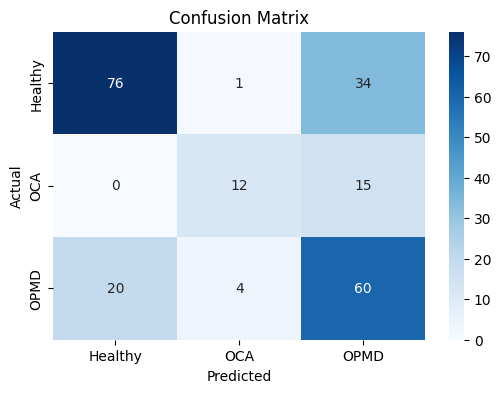

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

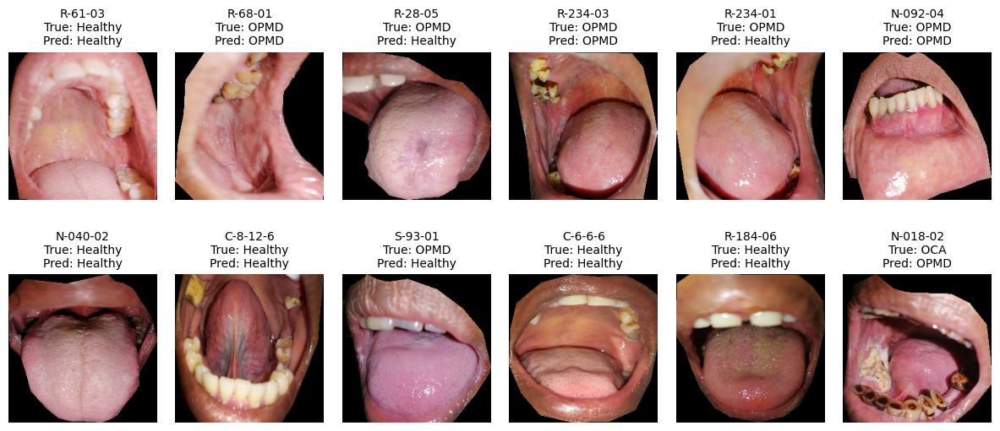

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=20)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 20
Test Accuracy: 64.8649 %


##### ResNet50

In [38]:
num_classes = 3
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
# Replace the final FC layer
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 151MB/s]


In [39]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [40]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):
  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.resnet50(weights=None)
  model.fc = nn.Linear(model.fc.in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [41]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.resnet50(weights=None)
  best_model.fc = nn.Linear(best_model.fc.in_features, num_classes)
  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc , best_model

###### EXP_1

In [42]:
CHECKPOINT_DIR = './resnet50_exp1_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [43]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [44]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.38it/s, Loss=0.5610]


Train Loss: 0.8667 | Train Acc: 0.5870


Validation Loss: 1.2375 | Validation Accuracy: 0.5570

New best model saved at epoch 1 with val acc = 0.5570

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.4929]


Train Loss: 0.4466 | Train Acc: 0.7773


Validation Loss: 1.2861 | Validation Accuracy: 0.5570

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.58it/s, Loss=0.2254]


Train Loss: 0.2857 | Train Acc: 0.8711


Validation Loss: 1.3208 | Validation Accuracy: 0.6624

New best model saved at epoch 3 with val acc = 0.6624

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.47it/s, Loss=0.2687]


Train Loss: 0.2081 | Train Acc: 0.9306


Validation Loss: 1.2565 | Validation Accuracy: 0.6371

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.3145]


Train Loss: 0.1383 | Train Acc: 0.9468


Validation Loss: 1.2346 | Validation Accuracy: 0.6667

New best model saved at epoch 5 with val acc = 0.6667

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.58it/s, Loss=0.4492]


Train Loss: 0.1030 | Train Acc: 0.9603


Validation Loss: 1.1826 | Validation Accuracy: 0.6624

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s, Loss=0.1008]


Train Loss: 0.0976 | Train Acc: 0.9630


Validation Loss: 1.4777 | Validation Accuracy: 0.6667

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s, Loss=0.0408]


Train Loss: 0.0505 | Train Acc: 0.9820


Validation Loss: 1.5253 | Validation Accuracy: 0.6371

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.44it/s, Loss=0.0116]


Train Loss: 0.0293 | Train Acc: 0.9919


Validation Loss: 1.2890 | Validation Accuracy: 0.6793

New best model saved at epoch 9 with val acc = 0.6793

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.48it/s, Loss=0.0427]


Train Loss: 0.0153 | Train Acc: 0.9973


Validation Loss: 1.4328 | Validation Accuracy: 0.6371

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:13<00:00,  1.37it/s, Loss=0.0078]


Train Loss: 0.0138 | Train Acc: 0.9973


Validation Loss: 1.5671 | Validation Accuracy: 0.6624

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.47it/s, Loss=0.0078]


Train Loss: 0.0100 | Train Acc: 0.9991


Validation Loss: 1.4295 | Validation Accuracy: 0.6793

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.47it/s, Loss=0.0112]


Train Loss: 0.0109 | Train Acc: 0.9964


Validation Loss: 1.3906 | Validation Accuracy: 0.6751

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s, Loss=0.0031]


Train Loss: 0.0109 | Train Acc: 0.9982


Validation Loss: 1.4454 | Validation Accuracy: 0.6582


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6793


In [46]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 9 with val acc = 0.6793
Test Accuracy: 65.3153 %


              precision    recall  f1-score   support

     Healthy       0.77      0.69      0.73       111
         OCA       0.60      0.44      0.51        27
        OPMD       0.55      0.67      0.60        84

    accuracy                           0.65       222
   macro avg       0.64      0.60      0.61       222
weighted avg       0.67      0.65      0.65       222



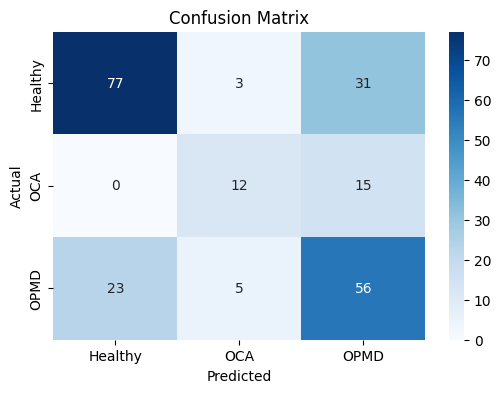

In [47]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

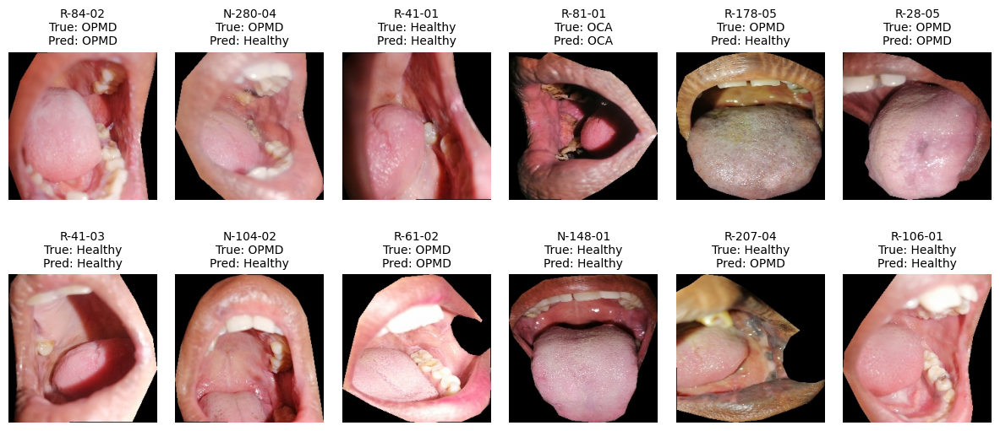

In [48]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [49]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=14)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 14
Test Accuracy: 64.8649 %


###### EXP_2

In [ ]:
CHECKPOINT_DIR = "./resnet50_Exp3_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
num_classes = 3
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
# Replace the final FC layer
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s, Loss=0.9436]


Train Loss: 1.0887 | Train Acc: 0.3390


Validation Loss: 1.0490 | Validation Accuracy: 0.4008

New best model saved at epoch 1 with val acc = 0.4008

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.9295]


Train Loss: 0.9782 | Train Acc: 0.5482


Validation Loss: 1.0047 | Validation Accuracy: 0.5485

New best model saved at epoch 2 with val acc = 0.5485

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.60it/s, Loss=0.8496]


Train Loss: 0.8916 | Train Acc: 0.6393


Validation Loss: 0.9756 | Validation Accuracy: 0.5274

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.55it/s, Loss=0.7168]


Train Loss: 0.8034 | Train Acc: 0.6844


Validation Loss: 0.9561 | Validation Accuracy: 0.5443

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.7672]


Train Loss: 0.7254 | Train Acc: 0.7115


Validation Loss: 0.9303 | Validation Accuracy: 0.5527

New best model saved at epoch 5 with val acc = 0.5527

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.7058]


Train Loss: 0.6470 | Train Acc: 0.7322


Validation Loss: 0.9230 | Validation Accuracy: 0.5612

New best model saved at epoch 6 with val acc = 0.5612

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.61it/s, Loss=0.4060]


Train Loss: 0.5852 | Train Acc: 0.7439


Validation Loss: 0.9274 | Validation Accuracy: 0.5401

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.4512]


Train Loss: 0.5232 | Train Acc: 0.7773


Validation Loss: 0.9082 | Validation Accuracy: 0.5823

New best model saved at epoch 8 with val acc = 0.5823

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.61it/s, Loss=0.4541]


Train Loss: 0.4768 | Train Acc: 0.7899


Validation Loss: 0.9143 | Validation Accuracy: 0.5781

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.3099]


Train Loss: 0.4388 | Train Acc: 0.8079


Validation Loss: 0.9312 | Validation Accuracy: 0.5612

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s, Loss=0.3754]


Train Loss: 0.4110 | Train Acc: 0.8242


Validation Loss: 0.9247 | Validation Accuracy: 0.5738

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.4038]


Train Loss: 0.3885 | Train Acc: 0.8305


Validation Loss: 0.9412 | Validation Accuracy: 0.5823

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.5021]


Train Loss: 0.3649 | Train Acc: 0.8458


Validation Loss: 0.9332 | Validation Accuracy: 0.6034

New best model saved at epoch 13 with val acc = 0.6034

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s, Loss=0.2731]


Train Loss: 0.3420 | Train Acc: 0.8512


Validation Loss: 0.9405 | Validation Accuracy: 0.6160

New best model saved at epoch 14 with val acc = 0.6160

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s, Loss=0.2287]


Train Loss: 0.3303 | Train Acc: 0.8674


Validation Loss: 0.9413 | Validation Accuracy: 0.6160

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.4553]


Train Loss: 0.3188 | Train Acc: 0.8674


Validation Loss: 0.9451 | Validation Accuracy: 0.6118

-----------------Epoch 17---------------------


Epoch 17/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.3416]


Train Loss: 0.3193 | Train Acc: 0.8783


Validation Loss: 0.9372 | Validation Accuracy: 0.6245

New best model saved at epoch 17 with val acc = 0.6245

-----------------Epoch 18---------------------


Epoch 18/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.55it/s, Loss=0.2676]


Train Loss: 0.3205 | Train Acc: 0.8756


Validation Loss: 0.9377 | Validation Accuracy: 0.6287

New best model saved at epoch 18 with val acc = 0.6287

-----------------Epoch 19---------------------


Epoch 19/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.55it/s, Loss=0.2105]


Train Loss: 0.3170 | Train Acc: 0.8702


Validation Loss: 0.9519 | Validation Accuracy: 0.6160

-----------------Epoch 20---------------------


Epoch 20/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.6004]


Train Loss: 0.3244 | Train Acc: 0.8729


Validation Loss: 0.9321 | Validation Accuracy: 0.6203


Training complete. Best validation accuracy: 0.6287


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 18 with val acc = 0.6287
Test Accuracy: 56.7568 %


              precision    recall  f1-score   support

     Healthy       0.68      0.62      0.65       111
         OCA       0.63      0.44      0.52        27
        OPMD       0.45      0.54      0.49        84

    accuracy                           0.57       222
   macro avg       0.58      0.53      0.55       222
weighted avg       0.58      0.57      0.57       222



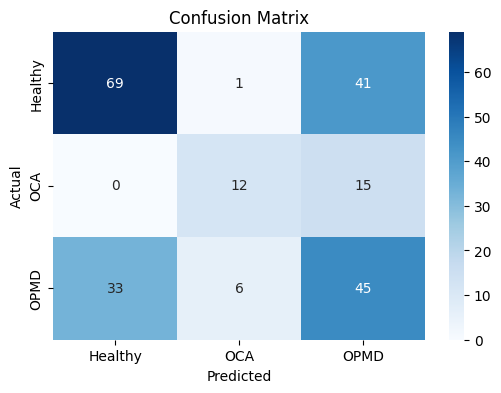

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

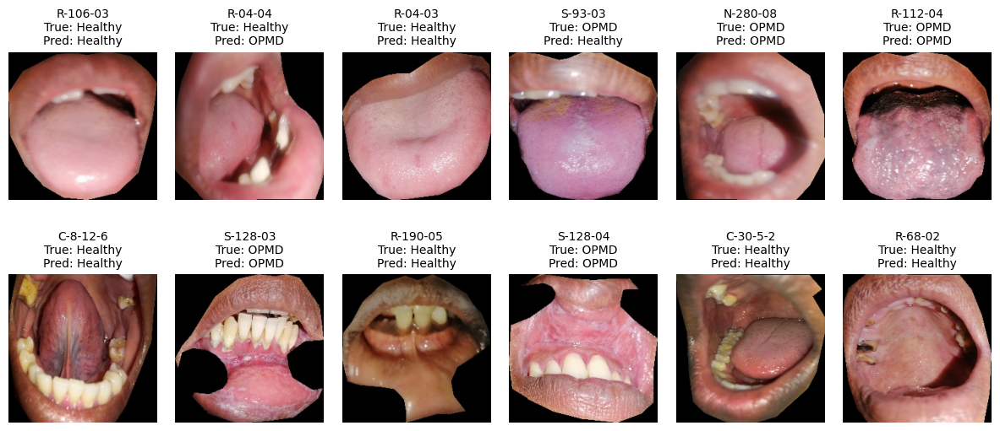

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=20)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 20
Test Accuracy: 56.3063 %


##### DenseNet121

In [ ]:
CHECKPOINT_DIR = "./densenet121_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
num_classes = 3
# Load pretrained DenseNet-121
model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
# Replace the classifier (final fully connected layer)
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(in_features, num_classes))
model = model.to(device)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 124MB/s]


In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):
  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.densenet121(weights=None)
  in_features = model.classifier.in_features
  model.classifier = nn.Sequential(
      nn.Dropout(0.4),
      nn.Linear(in_features, num_classes)
  )

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.densenet121(weights=None)
  in_features = best_model.classifier.in_features
  best_model.classifier = nn.Sequential(
      nn.Dropout(0.4),
      nn.Linear(in_features, num_classes))
  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc , best_model

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s, Loss=0.9131]


Train Loss: 1.0518 | Train Acc: 0.3688


Validation Loss: 0.9458 | Validation Accuracy: 0.5949

New best model saved at epoch 1 with val acc = 0.5949

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s, Loss=0.8049]


Train Loss: 0.7236 | Train Acc: 0.6754


Validation Loss: 0.8896 | Validation Accuracy: 0.6034

New best model saved at epoch 2 with val acc = 0.6034

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.4292]


Train Loss: 0.5464 | Train Acc: 0.7421


Validation Loss: 0.8723 | Validation Accuracy: 0.6414

New best model saved at epoch 3 with val acc = 0.6414

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.55it/s, Loss=0.4696]


Train Loss: 0.4195 | Train Acc: 0.8016


Validation Loss: 0.8408 | Validation Accuracy: 0.6414

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.6688]


Train Loss: 0.3133 | Train Acc: 0.8611


Validation Loss: 0.9167 | Validation Accuracy: 0.6751

New best model saved at epoch 5 with val acc = 0.6751

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.2697]


Train Loss: 0.2368 | Train Acc: 0.9062


Validation Loss: 1.0042 | Validation Accuracy: 0.6709

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.50it/s, Loss=0.2823]


Train Loss: 0.1977 | Train Acc: 0.9279


Validation Loss: 1.0990 | Validation Accuracy: 0.6962

New best model saved at epoch 7 with val acc = 0.6962

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.1377]


Train Loss: 0.1566 | Train Acc: 0.9531


Validation Loss: 1.1205 | Validation Accuracy: 0.6793

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.2102]


Train Loss: 0.1320 | Train Acc: 0.9432


Validation Loss: 1.1478 | Validation Accuracy: 0.6709

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.0619]


Train Loss: 0.1132 | Train Acc: 0.9675


Validation Loss: 1.2955 | Validation Accuracy: 0.7004

New best model saved at epoch 10 with val acc = 0.7004

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.0419]


Train Loss: 0.0835 | Train Acc: 0.9811


Validation Loss: 1.2288 | Validation Accuracy: 0.6835

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s, Loss=0.0908]


Train Loss: 0.0726 | Train Acc: 0.9784


Validation Loss: 1.1684 | Validation Accuracy: 0.6920

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.0748]


Train Loss: 0.0585 | Train Acc: 0.9883


Validation Loss: 1.2771 | Validation Accuracy: 0.6793

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.0576]


Train Loss: 0.0522 | Train Acc: 0.9901


Validation Loss: 1.2667 | Validation Accuracy: 0.6835

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.0490]


Train Loss: 0.0517 | Train Acc: 0.9901


Validation Loss: 1.2993 | Validation Accuracy: 0.6624


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.7004


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 10 with val acc = 0.7004
Test Accuracy: 64.4144 %


              precision    recall  f1-score   support

     Healthy       0.77      0.71      0.74       111
         OCA       0.58      0.26      0.36        27
        OPMD       0.53      0.68      0.60        84

    accuracy                           0.64       222
   macro avg       0.63      0.55      0.56       222
weighted avg       0.66      0.64      0.64       222



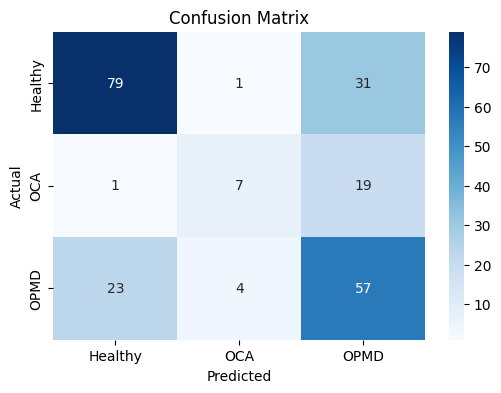

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

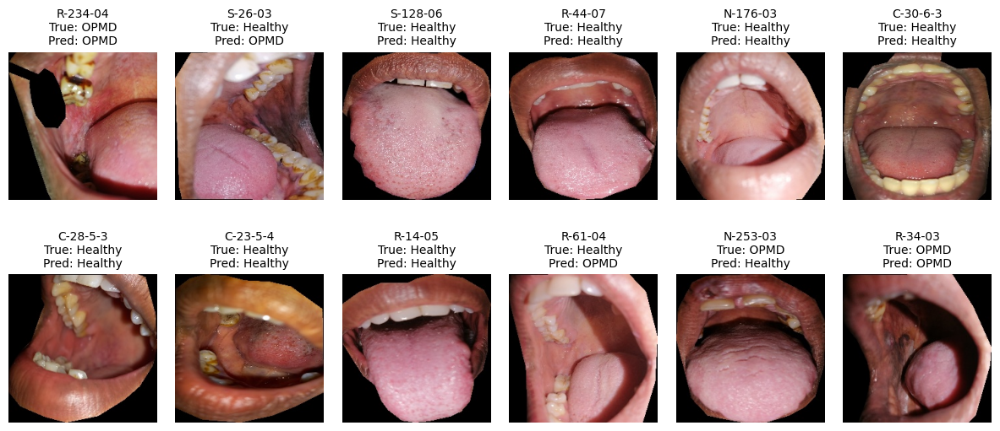

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=15)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 15
Test Accuracy: 68.0180 %


              precision    recall  f1-score   support

     Healthy       0.76      0.78      0.77       111
         OCA       0.67      0.37      0.48        27
        OPMD       0.59      0.64      0.61        84

    accuracy                           0.68       222
   macro avg       0.67      0.60      0.62       222
weighted avg       0.68      0.68      0.68       222



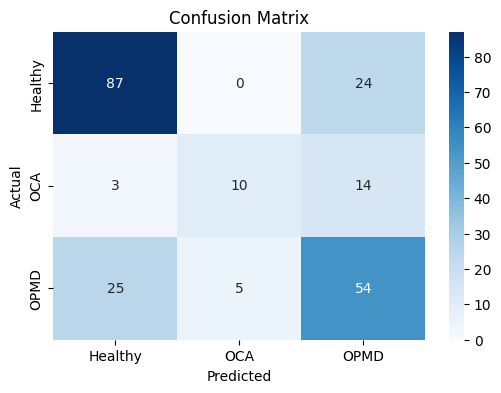

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

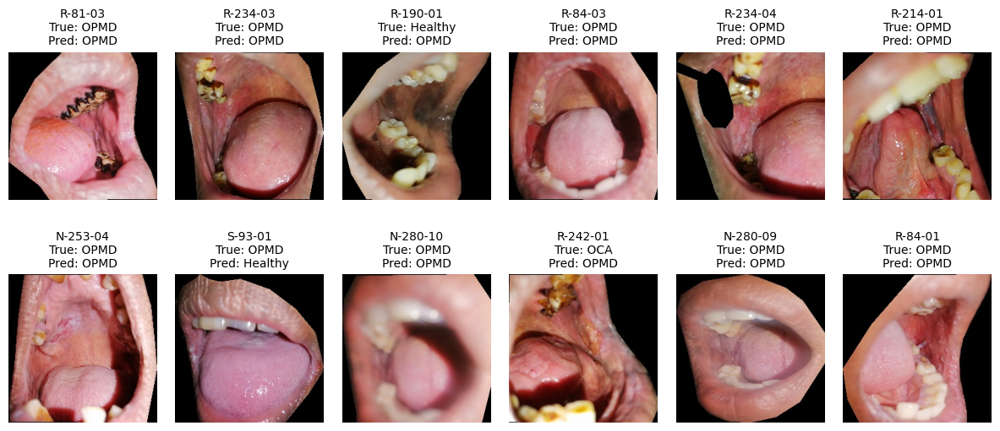

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### EfficientNet-B0

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.efficientnet_b0(weights=None)
  in_features = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.efficientnet_b0(weights=None)
  in_features = best_model.classifier[1].in_features
  best_model.classifier[1] = nn.Linear(in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
CHECKPOINT_DIR = './efficientnetb0_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
num_classes = 3
model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 155MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.82it/s, Loss=1.1022]


Train Loss: 1.0864 | Train Acc: 0.2904


Validation Loss: 1.0630 | Validation Accuracy: 0.4219

New best model saved at epoch 1 with val acc = 0.4219

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.35it/s, Loss=0.7128]


Train Loss: 0.9100 | Train Acc: 0.5509


Validation Loss: 0.9935 | Validation Accuracy: 0.4979

New best model saved at epoch 2 with val acc = 0.4979

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:08<00:00,  2.25it/s, Loss=0.9582]


Train Loss: 0.7774 | Train Acc: 0.6384


Validation Loss: 0.9565 | Validation Accuracy: 0.5232

New best model saved at epoch 3 with val acc = 0.5232

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:08<00:00,  2.12it/s, Loss=0.5954]


Train Loss: 0.6459 | Train Acc: 0.7178


Validation Loss: 0.9398 | Validation Accuracy: 0.5738

New best model saved at epoch 4 with val acc = 0.5738

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.70it/s, Loss=0.5849]


Train Loss: 0.5288 | Train Acc: 0.7601


Validation Loss: 0.8985 | Validation Accuracy: 0.6245

New best model saved at epoch 5 with val acc = 0.6245

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.27it/s, Loss=0.7685]


Train Loss: 0.4453 | Train Acc: 0.8133


Validation Loss: 0.8711 | Validation Accuracy: 0.6667

New best model saved at epoch 6 with val acc = 0.6667

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.66it/s, Loss=0.3058]


Train Loss: 0.3736 | Train Acc: 0.8386


Validation Loss: 0.8847 | Validation Accuracy: 0.6667

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.87it/s, Loss=0.2616]


Train Loss: 0.3247 | Train Acc: 0.8548


Validation Loss: 0.8734 | Validation Accuracy: 0.6751

New best model saved at epoch 8 with val acc = 0.6751

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.26it/s, Loss=0.2079]


Train Loss: 0.2783 | Train Acc: 0.8837


Validation Loss: 0.8991 | Validation Accuracy: 0.6835

New best model saved at epoch 9 with val acc = 0.6835

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.86it/s, Loss=0.1343]


Train Loss: 0.2356 | Train Acc: 0.8927


Validation Loss: 0.9372 | Validation Accuracy: 0.7131

New best model saved at epoch 10 with val acc = 0.7131

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s, Loss=0.1348]


Train Loss: 0.2067 | Train Acc: 0.9234


Validation Loss: 0.9339 | Validation Accuracy: 0.7046

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.36it/s, Loss=0.2871]


Train Loss: 0.1952 | Train Acc: 0.9324


Validation Loss: 0.9339 | Validation Accuracy: 0.7046

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.82it/s, Loss=0.1985]


Train Loss: 0.1770 | Train Acc: 0.9261


Validation Loss: 0.9294 | Validation Accuracy: 0.7173

New best model saved at epoch 13 with val acc = 0.7173

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.44it/s, Loss=0.1666]


Train Loss: 0.1670 | Train Acc: 0.9333


Validation Loss: 0.9289 | Validation Accuracy: 0.7342

New best model saved at epoch 14 with val acc = 0.7342

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.30it/s, Loss=0.2887]


Train Loss: 0.1571 | Train Acc: 0.9477


Validation Loss: 0.9338 | Validation Accuracy: 0.7173

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.81it/s, Loss=0.1969]


Train Loss: 0.1348 | Train Acc: 0.9585


Validation Loss: 0.9577 | Validation Accuracy: 0.7257

-----------------Epoch 17---------------------


Epoch 17/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.44it/s, Loss=0.0618]


Train Loss: 0.1534 | Train Acc: 0.9423


Validation Loss: 0.9914 | Validation Accuracy: 0.7004

-----------------Epoch 18---------------------


Epoch 18/20 [Train]: 100%|██████████| 18/18 [00:07<00:00,  2.49it/s, Loss=0.0905]


Train Loss: 0.1389 | Train Acc: 0.9540


Validation Loss: 0.9821 | Validation Accuracy: 0.7215

-----------------Epoch 19---------------------


Epoch 19/20 [Train]: 100%|██████████| 18/18 [00:06<00:00,  2.79it/s, Loss=0.1318]


Train Loss: 0.1368 | Train Acc: 0.9495


Validation Loss: 0.9722 | Validation Accuracy: 0.7089


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.7342


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 14 with val acc = 0.7342
Test Accuracy: 64.8649 %


              precision    recall  f1-score   support

     Healthy       0.76      0.67      0.71       111
         OCA       0.62      0.48      0.54        27
        OPMD       0.55      0.68      0.61        84

    accuracy                           0.65       222
   macro avg       0.64      0.61      0.62       222
weighted avg       0.66      0.65      0.65       222



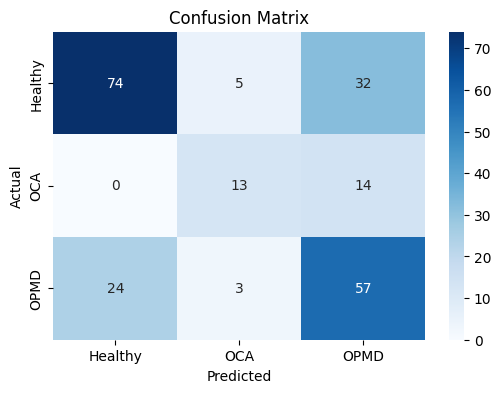

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

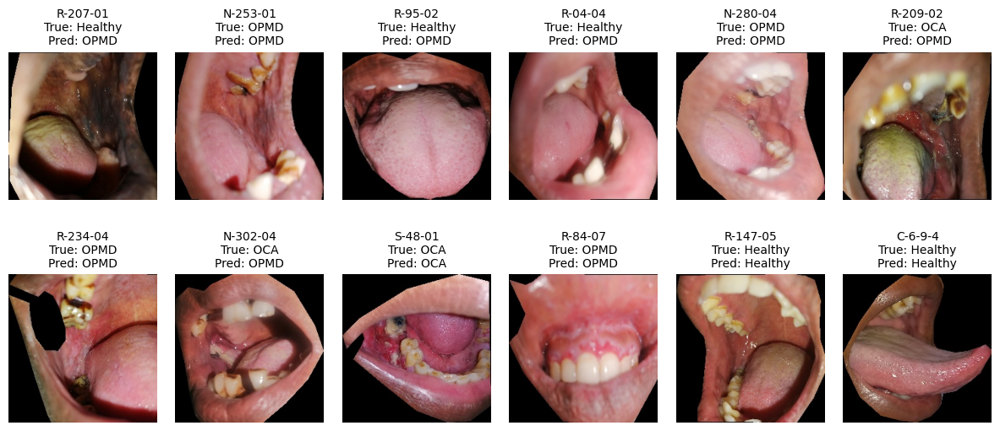

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=19)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 19
Test Accuracy: 66.6667 %


              precision    recall  f1-score   support

     Healthy       0.76      0.70      0.73       111
         OCA       0.62      0.48      0.54        27
        OPMD       0.58      0.68      0.62        84

    accuracy                           0.67       222
   macro avg       0.65      0.62      0.63       222
weighted avg       0.68      0.67      0.67       222



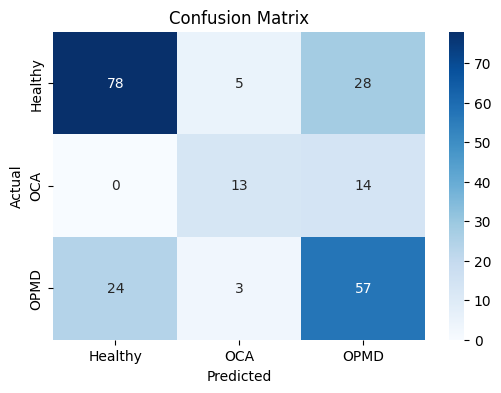

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

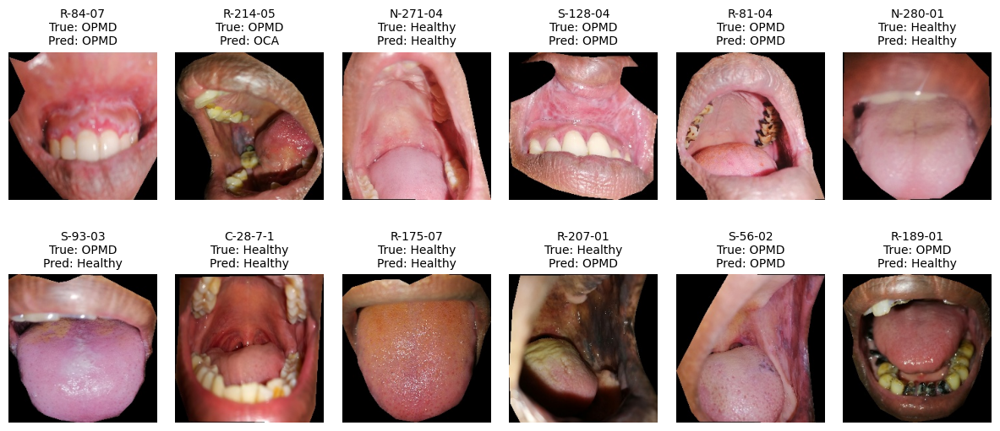

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### EfficientNet-B3

In [ ]:
CHECKPOINT_DIR = './efficientnetb3_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
num_classes = 3
model = models.efficientnet_b3(weights=models.EfficientNet_B3_Weights.IMAGENET1K_V1)
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth


100%|██████████| 47.2M/47.2M [00:00<00:00, 182MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=40, bias=False)
            (1): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(40, 10, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(10, 40, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = models.efficientnet_b3(weights=None)
  in_features = model.classifier[1].in_features
  model.classifier[1] = nn.Linear(in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = models.efficientnet_b3(weights=None)
  in_features = best_model.classifier[1].in_features
  best_model.classifier[1] = nn.Linear(in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s, Loss=0.9891]


Train Loss: 1.0798 | Train Acc: 0.4626


Validation Loss: 1.0746 | Validation Accuracy: 0.4557

New best model saved at epoch 1 with val acc = 0.4557

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=1.0159]


Train Loss: 0.9761 | Train Acc: 0.5906


Validation Loss: 1.0225 | Validation Accuracy: 0.4515

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.59it/s, Loss=0.7294]


Train Loss: 0.8784 | Train Acc: 0.6411


Validation Loss: 0.9878 | Validation Accuracy: 0.5105

New best model saved at epoch 3 with val acc = 0.5105

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.8915]


Train Loss: 0.7535 | Train Acc: 0.6682


Validation Loss: 0.9448 | Validation Accuracy: 0.5063

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.5175]


Train Loss: 0.6428 | Train Acc: 0.7223


Validation Loss: 0.9128 | Validation Accuracy: 0.5443

New best model saved at epoch 5 with val acc = 0.5443

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s, Loss=0.4420]


Train Loss: 0.5291 | Train Acc: 0.7538


Validation Loss: 0.8755 | Validation Accuracy: 0.5823

New best model saved at epoch 6 with val acc = 0.5823

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.3432]


Train Loss: 0.4769 | Train Acc: 0.7764


Validation Loss: 0.8726 | Validation Accuracy: 0.5949

New best model saved at epoch 7 with val acc = 0.5949

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.3613]


Train Loss: 0.3937 | Train Acc: 0.8233


Validation Loss: 0.8794 | Validation Accuracy: 0.6245

New best model saved at epoch 8 with val acc = 0.6245

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.2856]


Train Loss: 0.3476 | Train Acc: 0.8404


Validation Loss: 0.9042 | Validation Accuracy: 0.6371

New best model saved at epoch 9 with val acc = 0.6371

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.5816]


Train Loss: 0.3038 | Train Acc: 0.8693


Validation Loss: 0.9087 | Validation Accuracy: 0.6582

New best model saved at epoch 10 with val acc = 0.6582

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s, Loss=0.2609]


Train Loss: 0.2674 | Train Acc: 0.8873


Validation Loss: 0.9613 | Validation Accuracy: 0.6582

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.56it/s, Loss=0.2666]


Train Loss: 0.2323 | Train Acc: 0.9035


Validation Loss: 0.9632 | Validation Accuracy: 0.6624

New best model saved at epoch 12 with val acc = 0.6624

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s, Loss=0.1771]


Train Loss: 0.2209 | Train Acc: 0.9225


Validation Loss: 0.9686 | Validation Accuracy: 0.6624

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.2536]


Train Loss: 0.2148 | Train Acc: 0.9161


Validation Loss: 0.9899 | Validation Accuracy: 0.6624

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.1537]


Train Loss: 0.2038 | Train Acc: 0.9179


Validation Loss: 0.9558 | Validation Accuracy: 0.6667

New best model saved at epoch 15 with val acc = 0.6667

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s, Loss=0.1706]


Train Loss: 0.1968 | Train Acc: 0.9270


Validation Loss: 0.9710 | Validation Accuracy: 0.6835

New best model saved at epoch 16 with val acc = 0.6835

-----------------Epoch 17---------------------


Epoch 17/20 [Train]: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s, Loss=0.3731]


Train Loss: 0.2001 | Train Acc: 0.9152


Validation Loss: 0.9803 | Validation Accuracy: 0.6709

-----------------Epoch 18---------------------


Epoch 18/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.2567]


Train Loss: 0.1831 | Train Acc: 0.9306


Validation Loss: 0.9675 | Validation Accuracy: 0.6709

-----------------Epoch 19---------------------


Epoch 19/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.54it/s, Loss=0.6865]


Train Loss: 0.1750 | Train Acc: 0.9378


Validation Loss: 0.9749 | Validation Accuracy: 0.6709

-----------------Epoch 20---------------------


Epoch 20/20 [Train]: 100%|██████████| 18/18 [00:11<00:00,  1.55it/s, Loss=0.1371]


Train Loss: 0.1785 | Train Acc: 0.9252


Validation Loss: 0.9881 | Validation Accuracy: 0.6835


Training complete. Best validation accuracy: 0.6835


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 16 with val acc = 0.6835
Test Accuracy: 63.0631 %


              precision    recall  f1-score   support

     Healthy       0.73      0.65      0.69       111
         OCA       0.80      0.44      0.57        27
        OPMD       0.52      0.67      0.58        84

    accuracy                           0.63       222
   macro avg       0.68      0.59      0.61       222
weighted avg       0.66      0.63      0.63       222



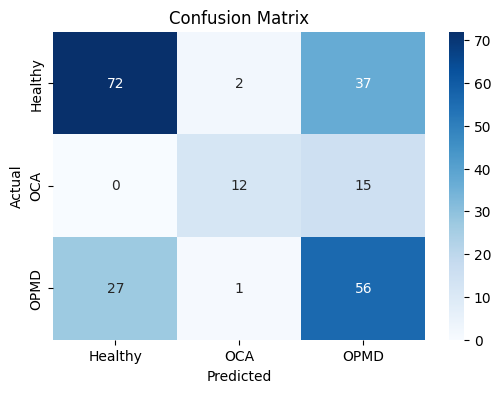

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

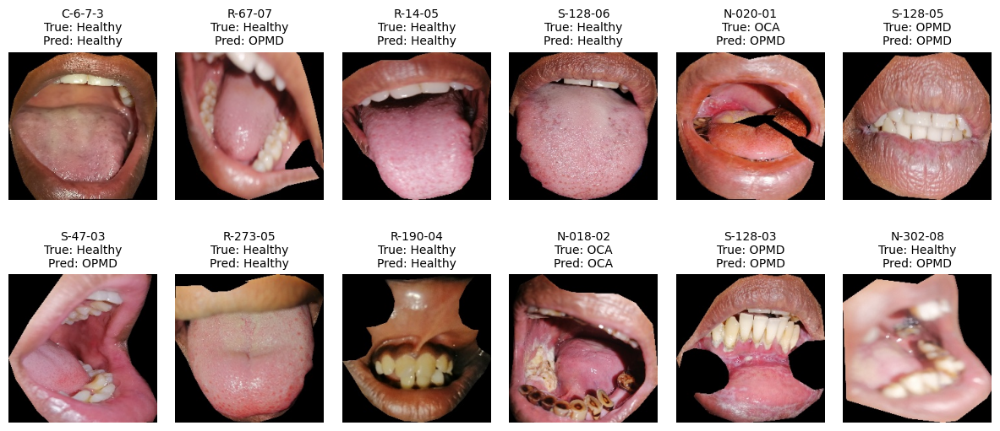

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=20)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 20
Test Accuracy: 62.6126 %


              precision    recall  f1-score   support

     Healthy       0.72      0.66      0.69       111
         OCA       0.79      0.41      0.54        27
        OPMD       0.52      0.65      0.58        84

    accuracy                           0.63       222
   macro avg       0.67      0.57      0.60       222
weighted avg       0.65      0.63      0.63       222



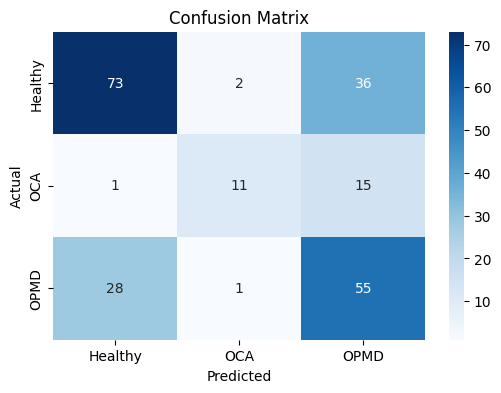

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

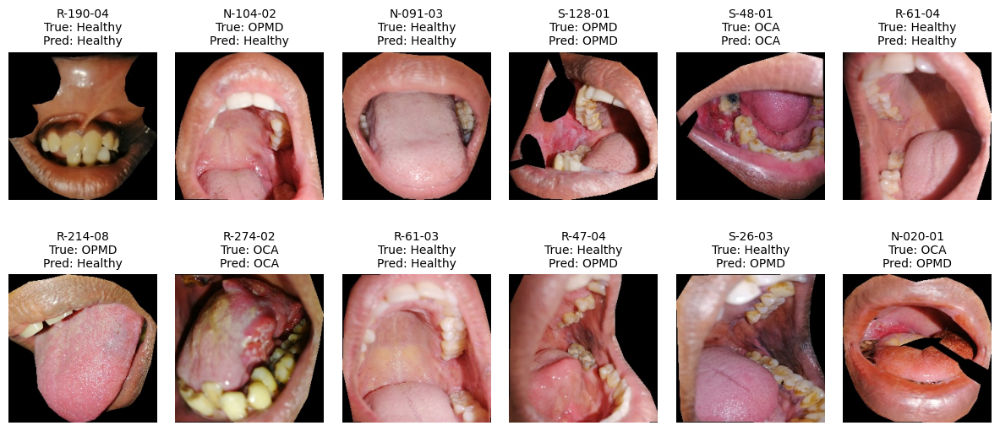

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### Vision Transformer (ViT_b_16)

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = vit_b_16(weights=None)
  model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = vit_b_16(weights=None)
  best_model.heads.head = nn.Linear(best_model.heads.head.in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

In [ ]:
from torchvision.models import vit_b_16, ViT_B_16_Weights
num_classes = 3
model = vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1)
model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:02<00:00, 162MB/s]


VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

###### EXP_1

In [ ]:
CHECKPOINT_DIR = './vit_EXP_1_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
from torchvision.models import vit_b_16, ViT_B_16_Weights
num_classes = 3
model = vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1)
model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)
model.to(device)

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.01s/it, Loss=0.8272]


Train Loss: 1.1059 | Train Acc: 0.4797


Validation Loss: 0.9046 | Validation Accuracy: 0.4937

New best model saved at epoch 1 with val acc = 0.4937

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.03s/it, Loss=0.7389]


Train Loss: 0.7388 | Train Acc: 0.6249


Validation Loss: 1.0214 | Validation Accuracy: 0.5992

New best model saved at epoch 2 with val acc = 0.5992

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.04s/it, Loss=0.5082]


Train Loss: 0.5283 | Train Acc: 0.7286


Validation Loss: 1.3053 | Validation Accuracy: 0.6751

New best model saved at epoch 3 with val acc = 0.6751

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.02s/it, Loss=0.3212]


Train Loss: 0.3486 | Train Acc: 0.8314


Validation Loss: 1.6138 | Validation Accuracy: 0.6160

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.05s/it, Loss=0.3206]


Train Loss: 0.3164 | Train Acc: 0.8602


Validation Loss: 1.4200 | Validation Accuracy: 0.6287

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.07s/it, Loss=0.6997]


Train Loss: 0.2722 | Train Acc: 0.8693


Validation Loss: 1.0670 | Validation Accuracy: 0.6624

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:51<00:00,  2.85s/it, Loss=0.2155]


Train Loss: 0.1938 | Train Acc: 0.9107


Validation Loss: 1.1865 | Validation Accuracy: 0.6371

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.07s/it, Loss=0.2013]


Train Loss: 0.1308 | Train Acc: 0.9513


Validation Loss: 1.5127 | Validation Accuracy: 0.6793

New best model saved at epoch 8 with val acc = 0.6793

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:41<00:00,  2.30s/it, Loss=0.1299]


Train Loss: 0.0769 | Train Acc: 0.9648


Validation Loss: 1.2787 | Validation Accuracy: 0.6540

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.05s/it, Loss=0.0573]


Train Loss: 0.0718 | Train Acc: 0.9739


Validation Loss: 1.3746 | Validation Accuracy: 0.6709

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:41<00:00,  2.30s/it, Loss=0.0344]


Train Loss: 0.0649 | Train Acc: 0.9757


Validation Loss: 2.0408 | Validation Accuracy: 0.6329

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.06s/it, Loss=0.0571]


Train Loss: 0.0301 | Train Acc: 0.9874


Validation Loss: 1.6917 | Validation Accuracy: 0.6456

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.08s/it, Loss=0.0125]


Train Loss: 0.0153 | Train Acc: 0.9964


Validation Loss: 1.8069 | Validation Accuracy: 0.6414


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.6793


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 8 with val acc = 0.6793
Test Accuracy: 68.0180 %


              precision    recall  f1-score   support

     Healthy       0.80      0.66      0.72       111
         OCA       0.87      0.48      0.62        27
        OPMD       0.56      0.77      0.65        84

    accuracy                           0.68       222
   macro avg       0.74      0.64      0.66       222
weighted avg       0.72      0.68      0.68       222



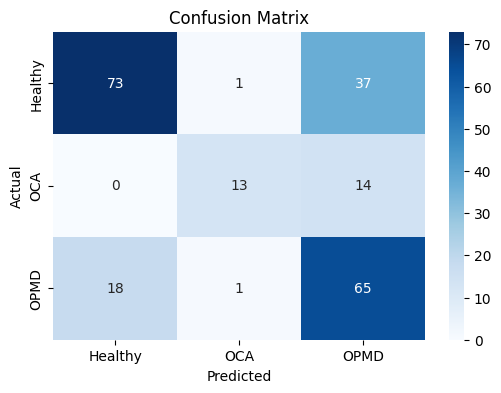

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

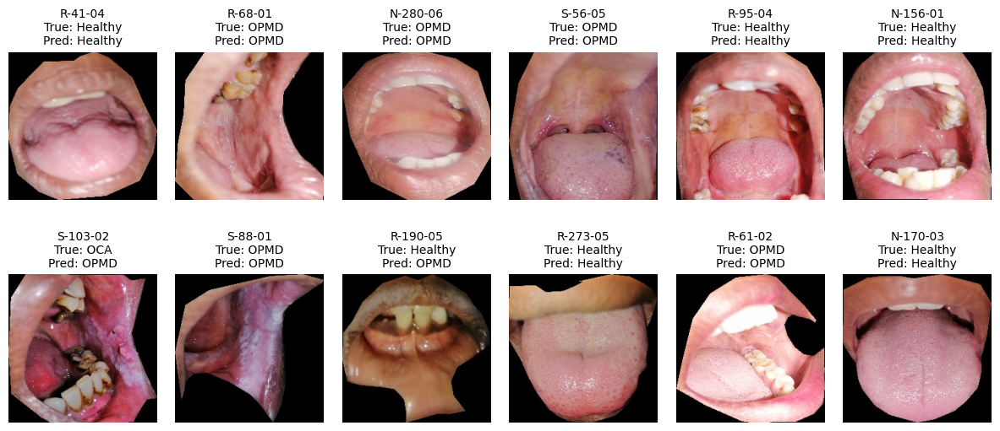

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=13)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 13
Test Accuracy: 69.8198 %


              precision    recall  f1-score   support

     Healthy       0.79      0.76      0.77       111
         OCA       0.80      0.30      0.43        27
        OPMD       0.60      0.75      0.67        84

    accuracy                           0.70       222
   macro avg       0.73      0.60      0.62       222
weighted avg       0.72      0.70      0.69       222



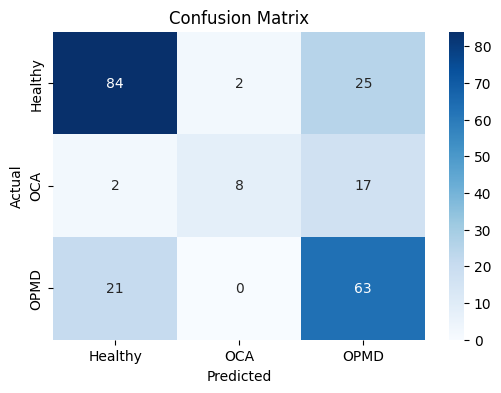

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

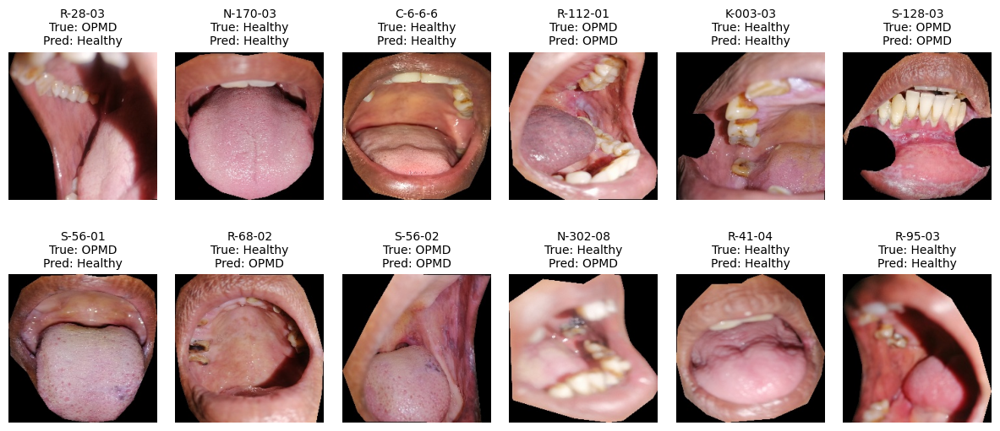

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

###### EXP_2

In [ ]:
CHECKPOINT_DIR = './vit_EXP2_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
from torchvision.models import vit_b_16, ViT_B_16_Weights
num_classes = 3
model = vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1)
model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)
model.to(device)

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.03s/it, Loss=0.7630]


Train Loss: 1.0248 | Train Acc: 0.4896


Validation Loss: 1.0248 | Validation Accuracy: 0.4852

New best model saved at epoch 1 with val acc = 0.4852

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.04s/it, Loss=0.7067]


Train Loss: 0.7814 | Train Acc: 0.6465


Validation Loss: 0.9022 | Validation Accuracy: 0.5823

New best model saved at epoch 2 with val acc = 0.5823

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.03s/it, Loss=0.6846]


Train Loss: 0.6286 | Train Acc: 0.7106


Validation Loss: 0.8840 | Validation Accuracy: 0.4937

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.09s/it, Loss=0.5861]


Train Loss: 0.5034 | Train Acc: 0.7647


Validation Loss: 0.8703 | Validation Accuracy: 0.5781

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.07s/it, Loss=0.3605]


Train Loss: 0.4236 | Train Acc: 0.8007


Validation Loss: 0.9006 | Validation Accuracy: 0.5443

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.09s/it, Loss=0.2404]


Train Loss: 0.3498 | Train Acc: 0.8287


Validation Loss: 0.9972 | Validation Accuracy: 0.5781

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.09s/it, Loss=0.2032]


Train Loss: 0.2971 | Train Acc: 0.8611


Validation Loss: 0.9230 | Validation Accuracy: 0.6540

New best model saved at epoch 7 with val acc = 0.6540

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.07s/it, Loss=0.4373]


Train Loss: 0.2509 | Train Acc: 0.8756


Validation Loss: 1.0480 | Validation Accuracy: 0.6456

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.07s/it, Loss=0.1596]


Train Loss: 0.2198 | Train Acc: 0.8972


Validation Loss: 1.1431 | Validation Accuracy: 0.6287

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.09s/it, Loss=0.1869]


Train Loss: 0.1922 | Train Acc: 0.9216


Validation Loss: 1.1598 | Validation Accuracy: 0.6160

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.08s/it, Loss=0.2024]


Train Loss: 0.1834 | Train Acc: 0.9179


Validation Loss: 1.2839 | Validation Accuracy: 0.6118

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.08s/it, Loss=0.1421]


Train Loss: 0.1674 | Train Acc: 0.9306


Validation Loss: 1.1360 | Validation Accuracy: 0.6582

New best model saved at epoch 12 with val acc = 0.6582

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:36<00:00,  2.05s/it, Loss=0.1044]


Train Loss: 0.1483 | Train Acc: 0.9405


Validation Loss: 1.2656 | Validation Accuracy: 0.6540

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.08s/it, Loss=0.1013]


Train Loss: 0.1327 | Train Acc: 0.9468


Validation Loss: 1.2090 | Validation Accuracy: 0.6667

New best model saved at epoch 14 with val acc = 0.6667

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.07s/it, Loss=0.1297]


Train Loss: 0.1208 | Train Acc: 0.9576


Validation Loss: 1.1918 | Validation Accuracy: 0.6667

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.09s/it, Loss=0.2118]


Train Loss: 0.1155 | Train Acc: 0.9576


Validation Loss: 1.1945 | Validation Accuracy: 0.6667

-----------------Epoch 17---------------------


Epoch 17/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.06s/it, Loss=0.0359]


Train Loss: 0.1126 | Train Acc: 0.9594


Validation Loss: 1.1885 | Validation Accuracy: 0.6667

-----------------Epoch 18---------------------


Epoch 18/20 [Train]: 100%|██████████| 18/18 [00:40<00:00,  2.25s/it, Loss=0.0780]


Train Loss: 0.1085 | Train Acc: 0.9603


Validation Loss: 1.2392 | Validation Accuracy: 0.6582

-----------------Epoch 19---------------------


Epoch 19/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.08s/it, Loss=0.1527]


Train Loss: 0.1082 | Train Acc: 0.9621


Validation Loss: 1.1879 | Validation Accuracy: 0.6709

New best model saved at epoch 19 with val acc = 0.6709

-----------------Epoch 20---------------------


Epoch 20/20 [Train]: 100%|██████████| 18/18 [00:37<00:00,  2.09s/it, Loss=0.1075]


Train Loss: 0.1103 | Train Acc: 0.9621


Validation Loss: 1.1898 | Validation Accuracy: 0.6709


Training complete. Best validation accuracy: 0.6709


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 19 with val acc = 0.6709
Test Accuracy: 67.1171 %


              precision    recall  f1-score   support

     Healthy       0.83      0.64      0.72       111
         OCA       0.71      0.44      0.55        27
        OPMD       0.55      0.79      0.65        84

    accuracy                           0.67       222
   macro avg       0.70      0.62      0.64       222
weighted avg       0.71      0.67      0.67       222



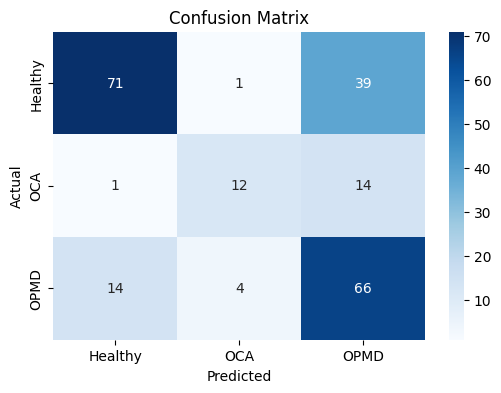

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

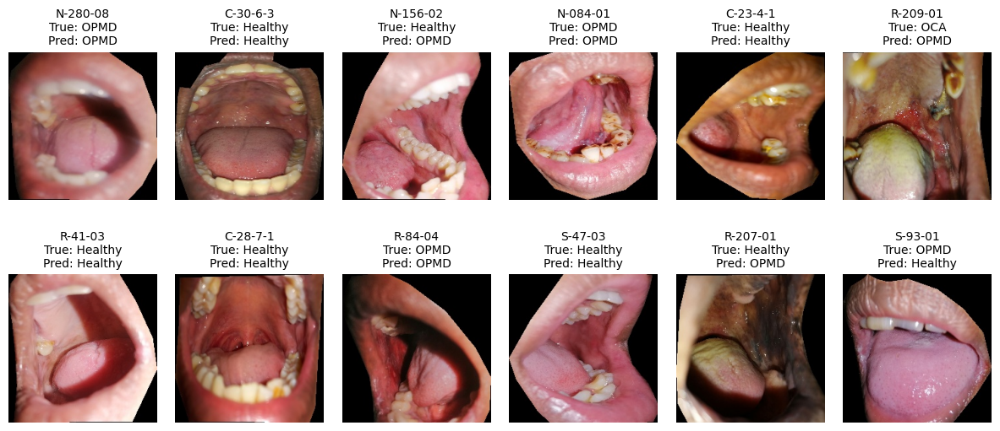

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=20)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 20
Test Accuracy: 66.6667 %


              precision    recall  f1-score   support

     Healthy       0.82      0.65      0.72       111
         OCA       0.67      0.44      0.53        27
        OPMD       0.55      0.76      0.64        84

    accuracy                           0.67       222
   macro avg       0.68      0.62      0.63       222
weighted avg       0.70      0.67      0.67       222



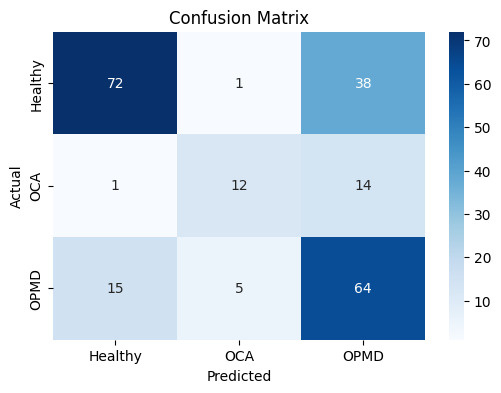

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

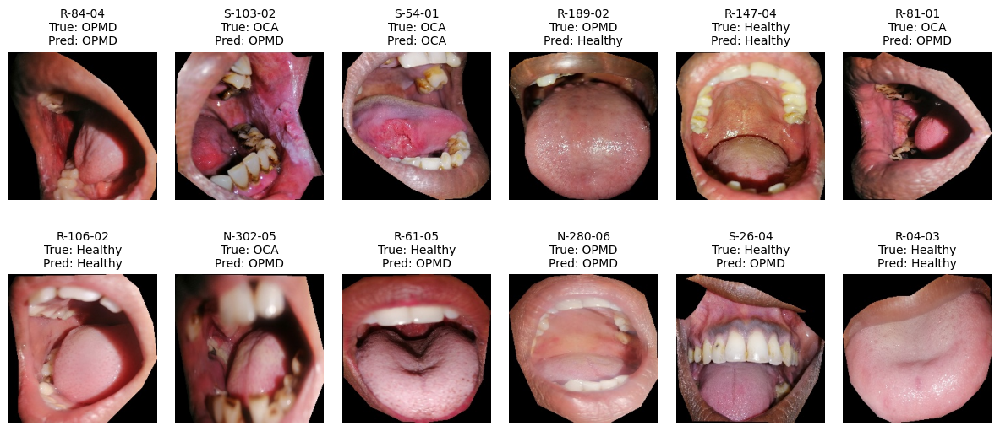

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

##### ConvNeXt(Modern CNN)
* A strong hybrid between CNN and transformer-style design

In [ ]:
CHECKPOINT_DIR = './convnext_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
num_classes = 3
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
model.classifier[2] = nn.Linear(model.classifier[2].in_features, num_classes)
model.to(device)

Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 145MB/s] 


ConvNeXt(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
    )
    (1): Sequential(
      (0): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=96, out_features=384, bias=True)
          (4): GELU(approximate='none')
          (5): Linear(in_features=384, out_features=96, bias=True)
          (6): Permute()
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=

In [ ]:
def test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch):

  ckpt_model_path = os.path.join(CHECKPOINT_DIR, f"model_epoch_{ckpt_epoch}.pth")
  num_classes = 3
  model = convnext_tiny(weights=None)
  model.classifier[2] = nn.Linear(model.classifier[2].in_features, num_classes)

  # Load the checkpoint
  checkpoint = torch.load(ckpt_model_path, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])
  model.to(device)
  model.eval()
  print(f"Loaded model from epoch {checkpoint['epoch']}")

  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)

  return test_acc, model

In [ ]:
def test_acc_best_model(CHECKPOINT_DIR):
  best_model_path = os.path.join(CHECKPOINT_DIR, "best_model.pth")
  num_classes = 3
  best_model = convnext_tiny(weights=None)
  best_model.classifier[2] = nn.Linear(best_model.classifier[2].in_features, num_classes)

  checkpoint = torch.load(best_model_path, map_location=device)
  best_model.load_state_dict(checkpoint['model_state_dict'])
  best_model.to(device)
  best_model.eval()
  print(f"Loaded best model from epoch {checkpoint['epoch']} with val acc = {checkpoint['best_val_acc']:.4f}")
  # Testing
  test_corrects = 0
  with torch.no_grad():
      for images, labels,_ in test_loader:
          images, labels = images.to(device), labels.to(device)
          outputs = best_model(images).to(device)
          _, preds = torch.max(outputs, 1)
          test_corrects += torch.sum(preds == labels.data)
  test_acc = test_corrects.double() / len(test_dataset)
  return test_acc, best_model

###### EXP_1

In [ ]:
weights = train_dataset.get_class_weights().to(device)
weights

tensor([0.6910, 4.4538, 0.7529], device='cuda:0')

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:25<00:00,  1.43s/it, Loss=1.2398]


Train Loss: 0.9374 | Train Acc: 0.5221


Validation Loss: 1.3146 | Validation Accuracy: 0.4008

New best model saved at epoch 1 with val acc = 0.4008

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s, Loss=0.5768]


Train Loss: 0.7014 | Train Acc: 0.6519


Validation Loss: 0.8442 | Validation Accuracy: 0.6329

New best model saved at epoch 2 with val acc = 0.6329

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:17<00:00,  1.00it/s, Loss=0.3372]


Train Loss: 0.4413 | Train Acc: 0.7836


Validation Loss: 0.8828 | Validation Accuracy: 0.6540

New best model saved at epoch 3 with val acc = 0.6540

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it, Loss=0.2516]


Train Loss: 0.2960 | Train Acc: 0.8521


Validation Loss: 0.9260 | Validation Accuracy: 0.6540

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it, Loss=0.1647]


Train Loss: 0.2206 | Train Acc: 0.8981


Validation Loss: 0.9525 | Validation Accuracy: 0.7215

New best model saved at epoch 5 with val acc = 0.7215

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:22<00:00,  1.25s/it, Loss=0.4429]


Train Loss: 0.1463 | Train Acc: 0.9414


Validation Loss: 0.9824 | Validation Accuracy: 0.6709

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it, Loss=0.1144]


Train Loss: 0.1237 | Train Acc: 0.9585


Validation Loss: 1.1312 | Validation Accuracy: 0.7426

New best model saved at epoch 7 with val acc = 0.7426

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.0907]


Train Loss: 0.1138 | Train Acc: 0.9567


Validation Loss: 1.4010 | Validation Accuracy: 0.6878

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:21<00:00,  1.20s/it, Loss=0.0139]


Train Loss: 0.0638 | Train Acc: 0.9829


Validation Loss: 1.0603 | Validation Accuracy: 0.7131

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.0493]


Train Loss: 0.0663 | Train Acc: 0.9820


Validation Loss: 1.1437 | Validation Accuracy: 0.7215

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.0365]


Train Loss: 0.0420 | Train Acc: 0.9874


Validation Loss: 1.1987 | Validation Accuracy: 0.7342

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.05s/it, Loss=0.0208]


Train Loss: 0.0379 | Train Acc: 0.9901


Validation Loss: 1.4119 | Validation Accuracy: 0.7257


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.7426


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 7 with val acc = 0.7426
Test Accuracy: 69.8198 %


              precision    recall  f1-score   support

     Healthy       0.82      0.68      0.74       111
         OCA       0.87      0.48      0.62        27
        OPMD       0.58      0.80      0.67        84

    accuracy                           0.70       222
   macro avg       0.76      0.65      0.68       222
weighted avg       0.74      0.70      0.70       222



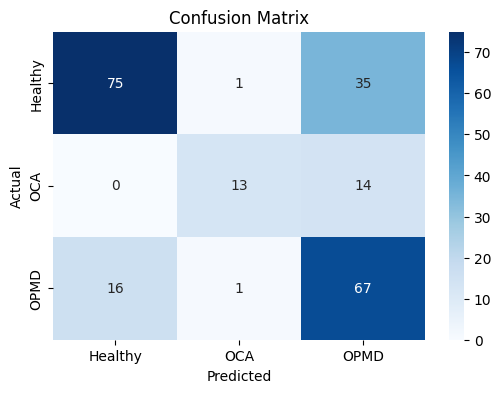

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

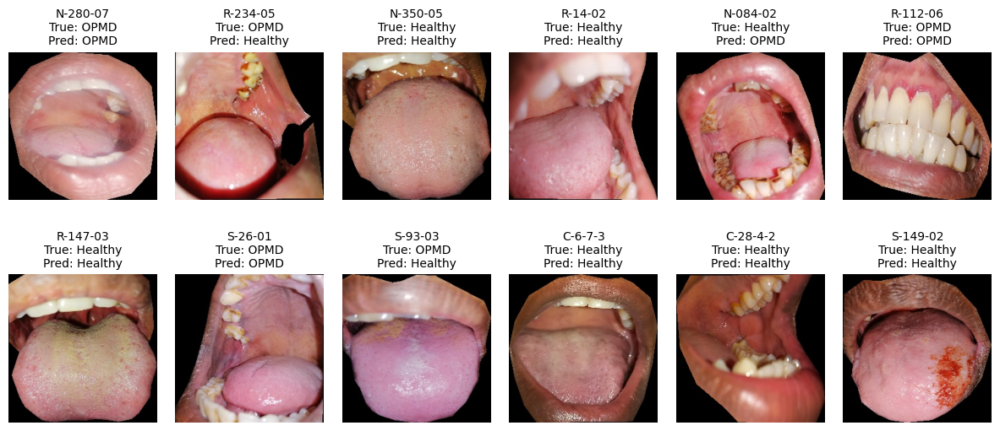

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=12)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 12
Test Accuracy: 68.0180 %


              precision    recall  f1-score   support

     Healthy       0.84      0.63      0.72       111
         OCA       0.85      0.41      0.55        27
        OPMD       0.56      0.83      0.67        84

    accuracy                           0.68       222
   macro avg       0.75      0.62      0.65       222
weighted avg       0.73      0.68      0.68       222



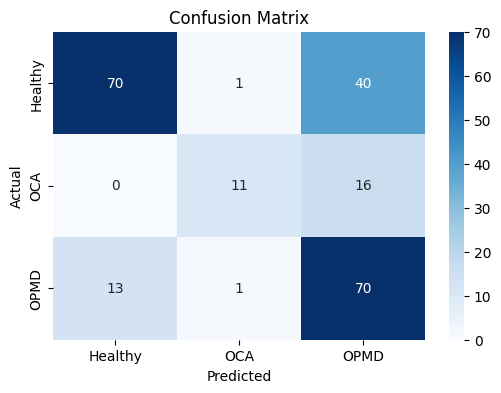

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

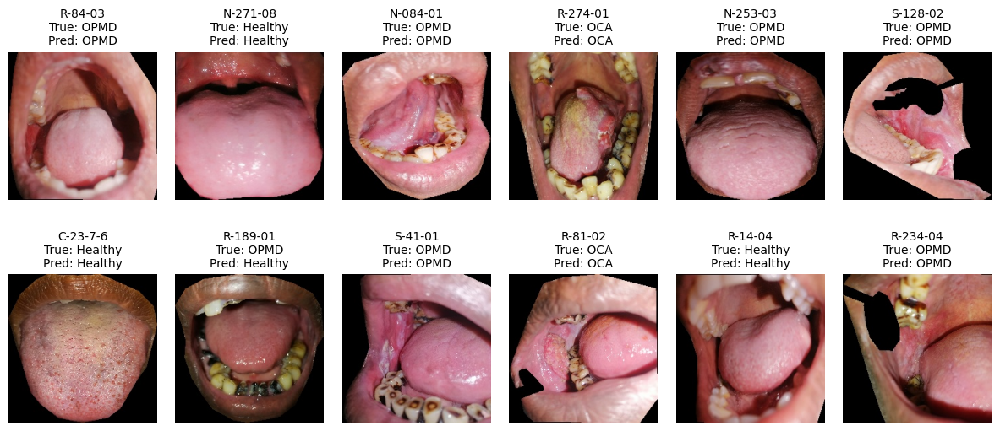

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

###### EXP_2

In [ ]:
CHECKPOINT_DIR = './convnext_exp2_checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok = True)

In [ ]:
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
num_classes = 3
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
model.classifier[2] = nn.Linear(model.classifier[2].in_features, num_classes)
model.to(device)

ConvNeXt(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
    )
    (1): Sequential(
      (0): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=96, out_features=384, bias=True)
          (4): GELU(approximate='none')
          (5): Linear(in_features=384, out_features=96, bias=True)
          (6): Permute()
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): CNBlock(
        (block): Sequential(
          (0): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (1): Permute()
          (2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=

In [ ]:
criterion = nn.CrossEntropyLoss(weight=train_dataset.get_class_weights().to(device))
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20)

In [ ]:
metrics =  train(model, train_loader, val_loader, CHECKPOINT_DIR, criterion, optimizer,scheduler, num_epochs=20, resume_epoch=None)

-----------------Epoch 1---------------------


Epoch 1/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.00s/it, Loss=1.1345]


Train Loss: 1.0937 | Train Acc: 0.3886


Validation Loss: 1.0922 | Validation Accuracy: 0.3840

New best model saved at epoch 1 with val acc = 0.3840

-----------------Epoch 2---------------------


Epoch 2/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it, Loss=1.0249]


Train Loss: 1.0157 | Train Acc: 0.5050


Validation Loss: 1.0564 | Validation Accuracy: 0.3966

New best model saved at epoch 2 with val acc = 0.3966

-----------------Epoch 3---------------------


Epoch 3/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.9799]


Train Loss: 0.9438 | Train Acc: 0.5482


Validation Loss: 1.0110 | Validation Accuracy: 0.4684

New best model saved at epoch 3 with val acc = 0.4684

-----------------Epoch 4---------------------


Epoch 4/20 [Train]: 100%|██████████| 18/18 [00:21<00:00,  1.20s/it, Loss=0.8023]


Train Loss: 0.8681 | Train Acc: 0.6339


Validation Loss: 1.0035 | Validation Accuracy: 0.4473

-----------------Epoch 5---------------------


Epoch 5/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it, Loss=0.7178]


Train Loss: 0.8104 | Train Acc: 0.6673


Validation Loss: 0.9656 | Validation Accuracy: 0.4895

New best model saved at epoch 5 with val acc = 0.4895

-----------------Epoch 6---------------------


Epoch 6/20 [Train]: 100%|██████████| 18/18 [00:20<00:00,  1.16s/it, Loss=0.7035]


Train Loss: 0.7610 | Train Acc: 0.6601


Validation Loss: 0.9631 | Validation Accuracy: 0.4726

-----------------Epoch 7---------------------


Epoch 7/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it, Loss=0.7524]


Train Loss: 0.6987 | Train Acc: 0.6835


Validation Loss: 0.9356 | Validation Accuracy: 0.5063

New best model saved at epoch 7 with val acc = 0.5063

-----------------Epoch 8---------------------


Epoch 8/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it, Loss=0.6595]


Train Loss: 0.6853 | Train Acc: 0.7051


Validation Loss: 0.9333 | Validation Accuracy: 0.5063

-----------------Epoch 9---------------------


Epoch 9/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it, Loss=0.7026]


Train Loss: 0.6563 | Train Acc: 0.7069


Validation Loss: 0.9259 | Validation Accuracy: 0.5148

New best model saved at epoch 9 with val acc = 0.5148

-----------------Epoch 10---------------------


Epoch 10/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it, Loss=0.4712]


Train Loss: 0.6249 | Train Acc: 0.7367


Validation Loss: 0.9272 | Validation Accuracy: 0.5316

New best model saved at epoch 10 with val acc = 0.5316

-----------------Epoch 11---------------------


Epoch 11/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it, Loss=0.6944]


Train Loss: 0.5865 | Train Acc: 0.7448


Validation Loss: 0.9305 | Validation Accuracy: 0.5485

New best model saved at epoch 11 with val acc = 0.5485

-----------------Epoch 12---------------------


Epoch 12/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it, Loss=0.7158]


Train Loss: 0.5720 | Train Acc: 0.7628


Validation Loss: 0.9225 | Validation Accuracy: 0.5485

-----------------Epoch 13---------------------


Epoch 13/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it, Loss=0.5451]


Train Loss: 0.5594 | Train Acc: 0.7701


Validation Loss: 0.9197 | Validation Accuracy: 0.5316

-----------------Epoch 14---------------------


Epoch 14/20 [Train]: 100%|██████████| 18/18 [00:21<00:00,  1.20s/it, Loss=0.4645]


Train Loss: 0.5539 | Train Acc: 0.7692


Validation Loss: 0.9215 | Validation Accuracy: 0.5443

-----------------Epoch 15---------------------


Epoch 15/20 [Train]: 100%|██████████| 18/18 [00:20<00:00,  1.16s/it, Loss=0.6412]


Train Loss: 0.5425 | Train Acc: 0.7764


Validation Loss: 0.9201 | Validation Accuracy: 0.5443

-----------------Epoch 16---------------------


Epoch 16/20 [Train]: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it, Loss=0.6040]


Train Loss: 0.5272 | Train Acc: 0.7701


Validation Loss: 0.9184 | Validation Accuracy: 0.5443


Early stopping. No improvement in 5 epochs.

Training complete. Best validation accuracy: 0.5485


In [ ]:
t1, best_model = test_acc_best_model(CHECKPOINT_DIR)
print(f"Test Accuracy: {t1*100:.4f} %")

Loaded best model from epoch 11 with val acc = 0.5485
Test Accuracy: 57.6577 %


              precision    recall  f1-score   support

     Healthy       0.66      0.60      0.63       111
         OCA       0.48      0.59      0.53        27
        OPMD       0.51      0.54      0.52        84

    accuracy                           0.58       222
   macro avg       0.55      0.58      0.56       222
weighted avg       0.58      0.58      0.58       222



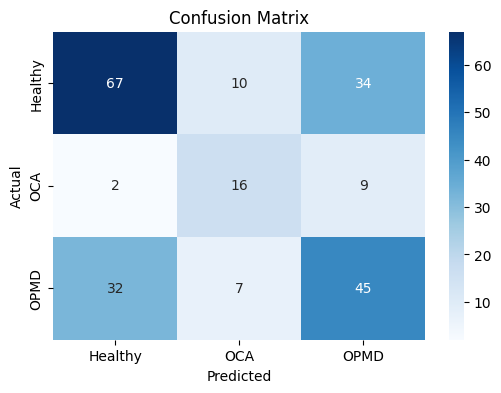

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(best_model, test_loader, device, classes)

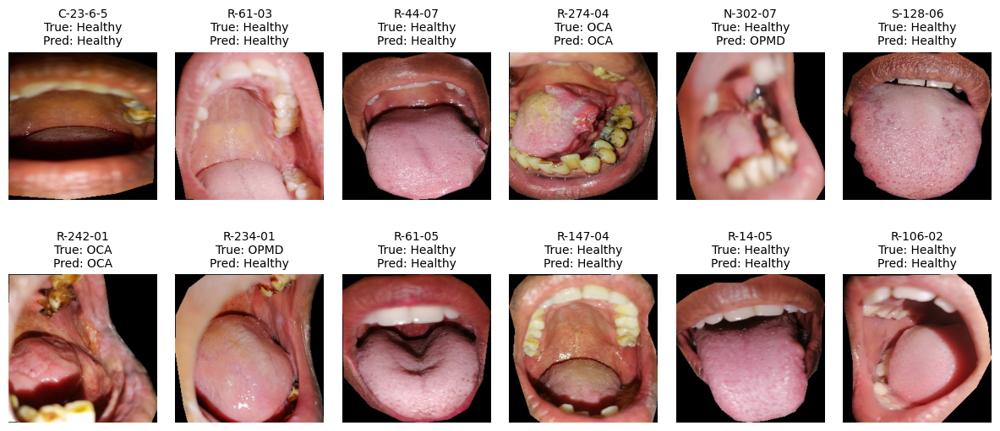

In [ ]:
visualize_predictions(best_model, test_loader, device, classes, num_images=12)

In [ ]:
t2, ckpt_model= test_acc_ckpt(CHECKPOINT_DIR,ckpt_epoch=16)
print(f"Test Accuracy: {t2*100:.4f} %")

Loaded model from epoch 16
Test Accuracy: 59.0090 %


              precision    recall  f1-score   support

     Healthy       0.68      0.61      0.64       111
         OCA       0.48      0.59      0.53        27
        OPMD       0.53      0.56      0.54        84

    accuracy                           0.59       222
   macro avg       0.56      0.59      0.57       222
weighted avg       0.60      0.59      0.59       222



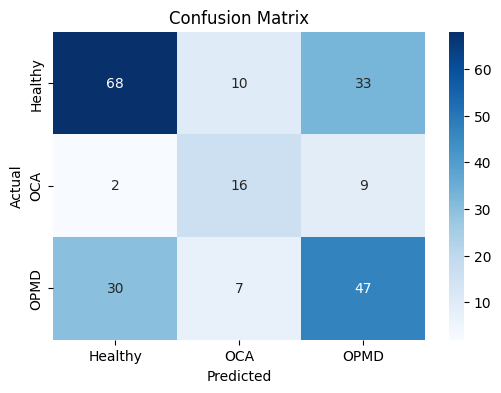

In [ ]:
classes = train_dataset.classes
all_labels, all_preds, cm = evaluate_model(ckpt_model, test_loader, device, classes)

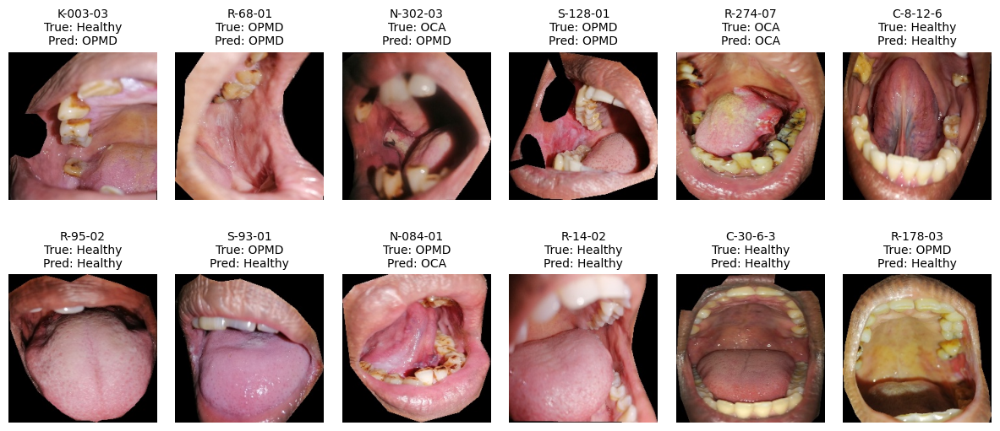

In [ ]:
visualize_predictions(ckpt_model, test_loader, device, classes, num_images=12)

## Model Performance Comparison Table

| Model | Learning Rate | Val Acc (%) | Test Acc (%) | Healthy F1 | OCA F1 | OPMD F1 | Macro Avg F1 | Weighted Avg F1 |
|-------|---------------|-------------|--------------|------------|------------|-------------|------------------|---------------------|
| **ResNet18** | 1e-4 | 68.4 | 66.7 | 0.73 | 0.55 | 0.62 | 0.63 | 0.67 |
| **ResNet50** | 1e-4 | 67.9 | 65.3 | 0.73 | 0.51 | 0.60 | 0.61 | 0.65 |
| **ResNet50** | 1e-5 | 62.9 | 58.1 | 0.65 | 0.52 | 0.49 | 0.55 | 0.57 |
| **DenseNet121** | 1e-4 | 66.2 | ***68.0*** | ***0.77*** | 0.48 | 0.61 | 0.62 | 0.68 |
| **EfficientNet-B0** | 1e-4 | ***70.9*** | 66.7 | 0.73 | 0.54 | 0.62 | 0.63 | 0.67 |
| **EfficientNet-B3** | 1e-4 | 68.4 | 63.1 | 0.69 | 0.57 | 0.58 | 0.61 | 0.63 |
| **ViT_b_16** | 1e-4 | 67.9 | ***68.0*** | 0.72 | ***0.62*** | 0.65 | 0.66 | 0.68 |
| **ViT_b_16** | 1e-5 | 67.1 | 67.1 | 0.72 | 0.55 | 0.65 | 0.64 | 0.67 |
| **ConvNeXt** | **1e-4** | ***74.3*** | ***69.8*** | 0.74 | 0.62 | ***0.67*** | ***0.68*** | ***0.70*** |
| **ConvNeXt** | 1e-5 | 54.4 | 59.0 | 0.64 | 0.53 | 0.54 | 0.57 | 0.59 |



**1. ConvNeXt - lr=1e-4**
- Test Accuracy: 69.8%
- Highest Validation Accuracy: 74.3%
- Best Overall Balance - strong performance across all metrics
- Good OPMD (F1: 0.67) and OCA detection(F1: 0.62)


**2. ViT_b_16 - lr=1e-4**
- Test Accuracy: 68.0%, Validation Accuracy: 67.9%
- Best OCA detection (F1: 0.62)
- Strong balanced performance

**3. DenseNet121 - lr=1e-4**
- Test Accuracy: 68.0%, Validation Accuracy: 66.2%
- Best Healthy detection (F1: 0.77)
- Consistent and reliable performance


**4. ResNet18 - lr=1e-4**
- Test Accuracy: 66.7%, Validation Accuracy: 68.4%
- Good balance across all classes


**Learning Rate Optimization:**
- **Optimal LR**: 1e-4 consistently performs best
- **ViT_b_16** : 1e-4 (68.0%) > 1e-5 (67.1%)
- **ConvNeXt**: 1e-4 (69.8%) > 1e-5 (59.0%)
- **ResNet50**: 1e-4 (65.3%) > 1e-5 (58.1%)

**Class-Wise Performance**

**Healthy Class:**
- **Best**: DenseNet121-1e-4 (F1: 0.77)


**OCA (Minority Class):**
- **Best**: ViT_b_16-1e-4 (F1: 0.62) & ConvNeXt-1e-4 (F1: 0.62)


**OPMD Class:**
- **Best**: ConvNeXt-1e-4 (F1: 0.67)